In [2]:
!pip install imblearn
!pip install delayed

In [6]:
pip install -U imbalanced-learn


  Obtaining dependency information for imbalanced-learn from https://files.pythonhosted.org/packages/9d/41/721fec82606242a2072ee909086ff918dfad7d0199a9dfd4928df9c72494/imbalanced_learn-0.13.0-py3-none-any.whl.metadata
  Using cached imbalanced_learn-0.13.0-py3-none-any.whl.metadata (8.8 kB)
Using cached imbalanced_learn-0.13.0-py3-none-any.whl (238 kB)
  Attempting uninstall: imbalanced-learn
    Found existing installation: imbalanced-learn 0.11.0
    Uninstalling imbalanced-learn-0.11.0:
      Successfully uninstalled imbalanced-learn-0.11.0


In [1]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, cross_val_score, cross_val_predict
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import classification_report
from sklearn.preprocessing import StandardScaler, label_binarize, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import RFE, chi2, mutual_info_classif, f_classif, SelectKBest, SequentialFeatureSelector
from imblearn.over_sampling import SMOTE

from utils import calculate_evaluation_metrics, display_shap_plot, display_lime_plot, plot_class_probability_distributions, get_selected_features

<h3>Classification results, input: statistics from the <b>first 5</b> seasons</h3>

In [2]:
df_5 = pd.read_csv('data/final_dataset_5_seasons.csv', low_memory=False)

class_mapping = {'bench': 0, 'starter': 1, 'all-star': 2}
df_5['Player_class_num'] = df_5['Player_class'].map(class_mapping)

final_dataset_5_seasons = df_5[get_selected_features(5)]

X = final_dataset_5_seasons.drop(columns=['Player_class_num'])
y = final_dataset_5_seasons['Player_class_num']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

In [3]:
final_dataset_5_seasons

,Seasons_played,GS_1_5,MP_1_5,FG_1_5,FT_1_5,TRB_1_5,TOV_1_5,PTS_1_5,PER_1_5,USG%_1_5,DWS_1_5,WS_1_5,WS/48_1_5,BPM_1_5,AS_1_5,Player_class_num
0,9,46.4,27.24,6.46,1.96,2.00,1.76,15.52,14.98,0.260,1.28,3.30,0.064,-1.24,0,0
1,12,73.2,38.14,7.46,5.84,8.14,3.10,20.96,19.70,0.269,1.64,6.34,0.106,1.16,0,1
2,11,58.4,32.08,5.44,3.66,3.02,2.16,16.32,17.02,0.198,2.10,6.34,0.125,2.74,0,1
3,11,64.6,25.58,3.62,1.60,7.00,1.38,8.84,15.58,0.143,2.50,5.94,0.139,-0.48,0,1
4,8,47.8,28.56,5.28,3.32,8.42,2.10,13.90,19.68,0.203,3.18,7.10,0.174,2.70,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
937,17,28.0,28.26,5.34,1.58,4.98,1.30,12.56,16.62,0.206,2.32,4.92,0.120,0.30,0,1
938,7,70.6,33.92,8.18,6.86,3.72,4.16,25.72,22.26,0.327,1.00,6.62,0.133,3.10,2,1
939,11,33.2,22.48,2.96,2.02,5.64,1.00,7.94,15.18,0.162,2.00,4.04,0.137,-0.74,0,1
940,8,26.2,16.92,2.66,1.32,4.16,0.84,6.68,14.74,0.184,1.16,2.76,0.111,-2.20,0,1


Best params: {'class_weight': None, 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': 25, 'min_samples_leaf': 2, 'n_estimators': 200}

=== Classification Report ===
               precision    recall  f1-score   support

           0       0.70      0.80      0.74        88
           1       0.61      0.57      0.59        75
           2       0.83      0.58      0.68        26

    accuracy                           0.68       189
   macro avg       0.71      0.65      0.67       189
weighted avg       0.68      0.68      0.67       189


=== ROC AUC value ===
 0.8736708916124799


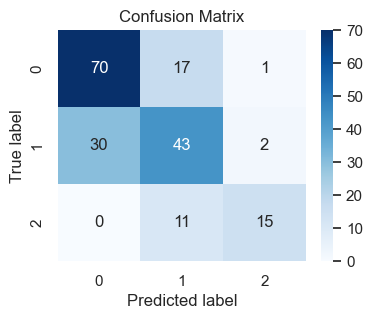

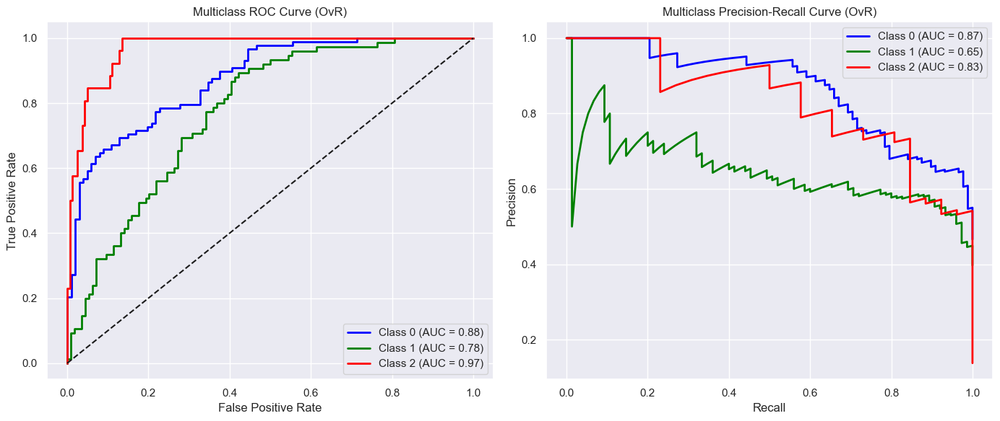

In [54]:
param_grid = {
    'n_estimators': [100, 200, 300, 400, 500],
    'max_depth': [None, 10, 20, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5],
    'max_leaf_nodes': [10, 20, 25, 30],
    'max_features': ['sqrt', 10, 15],
    'class_weight': [None, 'balanced']
}

grid_search = GridSearchCV(
    RandomForestClassifier(random_state=42),
    param_grid,
    cv=10,
    scoring='f1_macro',
    n_jobs=-1
)

grid_search.fit(X_train, y_train)
print("Best params:", grid_search.best_params_)

best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)

calculate_evaluation_metrics(best_model, y_test, y_pred, y_pred_proba)


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.74      0.78      0.76        88
           1       0.64      0.63      0.64        75
           2       0.78      0.69      0.73        26

    accuracy                           0.71       189
   macro avg       0.72      0.70      0.71       189
weighted avg       0.71      0.71      0.71       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8739969738468925
PR AUC: 0.7726115854668848


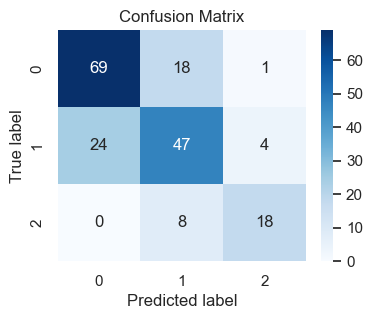

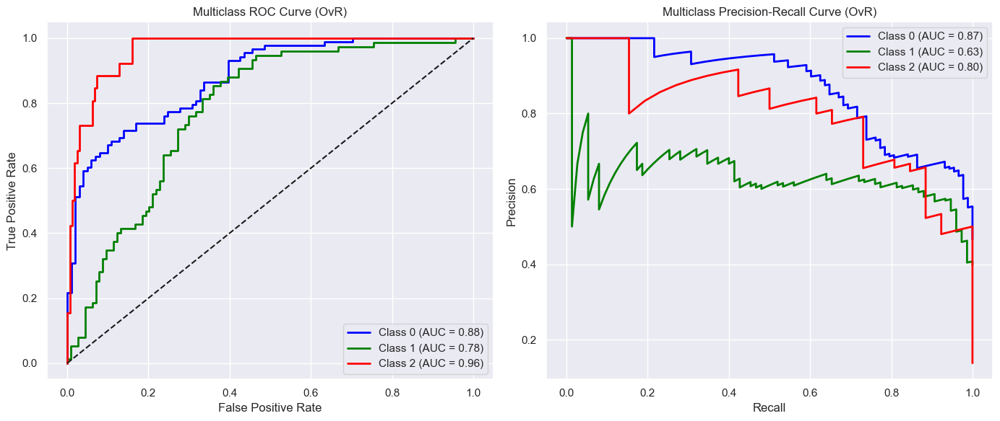


Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.95      0.90      0.93       163
           1       0.54      0.73      0.62        26

    accuracy                           0.88       189
   macro avg       0.75      0.82      0.78       189
weighted avg       0.90      0.88      0.89       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.9360547428032091
PR AUC: 0.7514432184370157


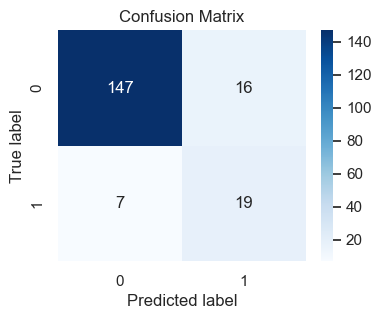

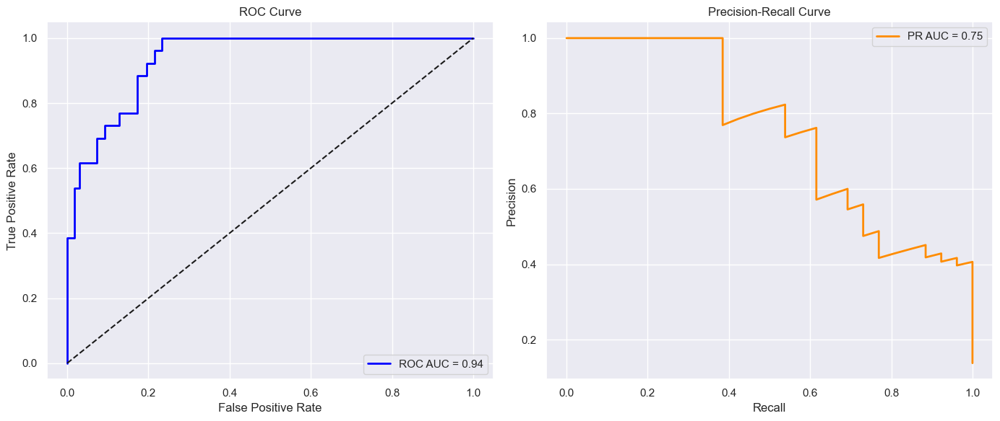


Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.78      0.73      0.75       114
           1       0.63      0.69      0.66        75

    accuracy                           0.71       189
   macro avg       0.70      0.71      0.71       189
weighted avg       0.72      0.71      0.72       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7974269005847953
PR AUC: 0.6898070852871379


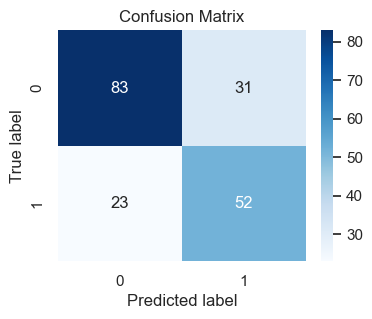

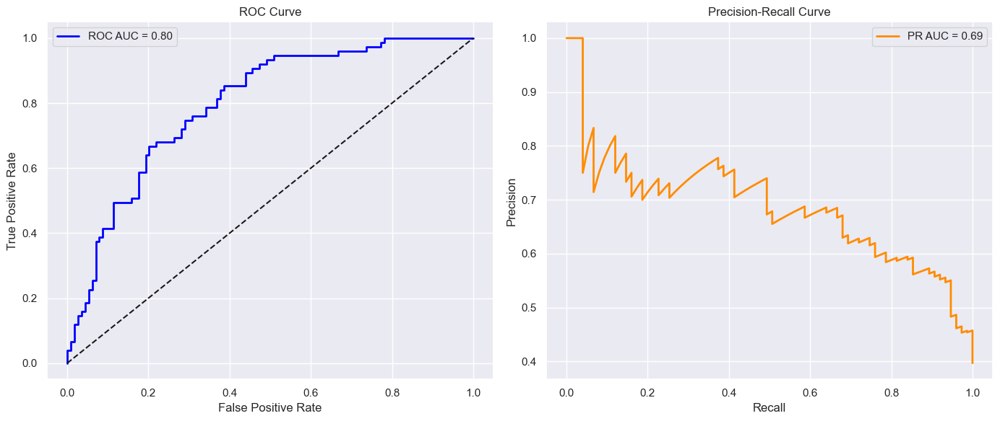


Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.79      0.80      0.79       101
           1       0.77      0.75      0.76        88

    accuracy                           0.78       189
   macro avg       0.78      0.78      0.78       189
weighted avg       0.78      0.78      0.78       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8607110711071106
PR AUC: 0.8234044410022505


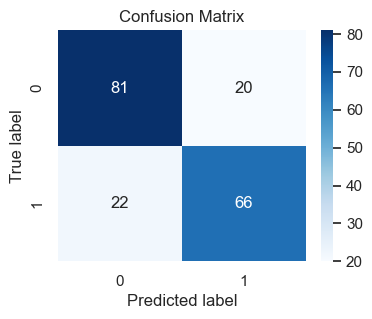

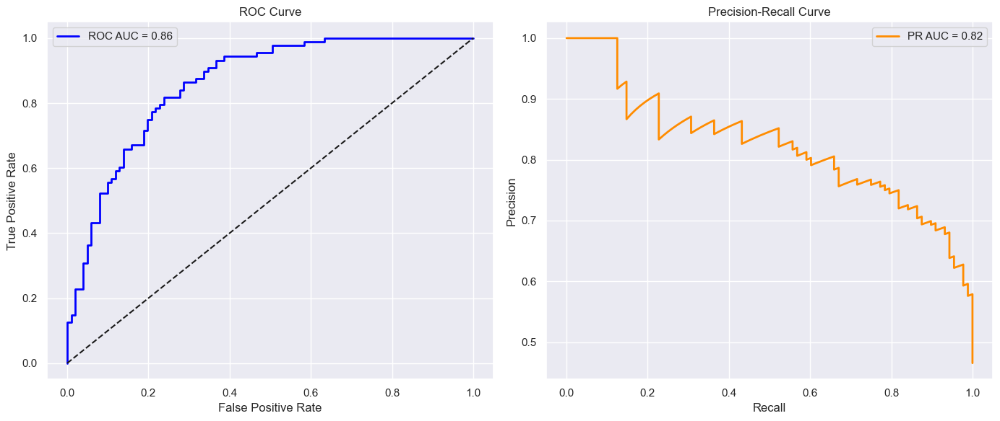

In [5]:
rf = RandomForestClassifier(
    random_state=42, 
    n_estimators=200, 
    min_samples_leaf=2, 
    max_leaf_nodes=25, 
    class_weight='balanced')

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
y_pred_proba = rf.predict_proba(X_test)

calculate_evaluation_metrics(rf, y_test, y_pred, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_5_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    rf_bin = RandomForestClassifier(
        random_state=42, 
        n_estimators=200, 
        min_samples_leaf=2, 
        max_leaf_nodes=25, 
        class_weight='balanced')

    rf_bin.fit(X_train_bin, y_train_bin)

    y_pred_bin = rf_bin.predict(X_test_bin)
    y_pred_proba_bin = rf_bin.predict_proba(X_test_bin)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(rf_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)

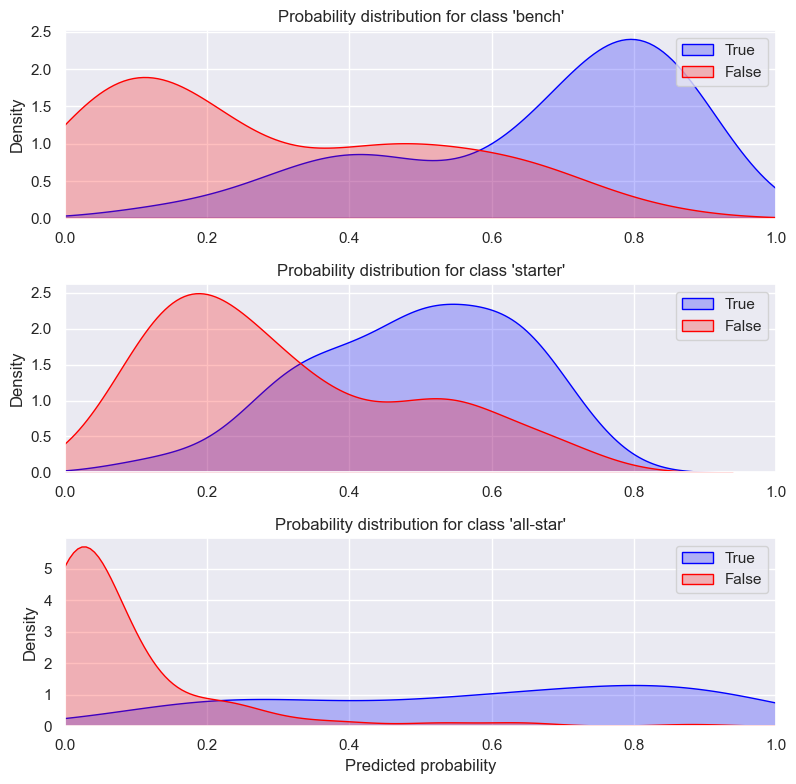

PermutationExplainer explainer: 190it [04:38,  1.49s/it]                         


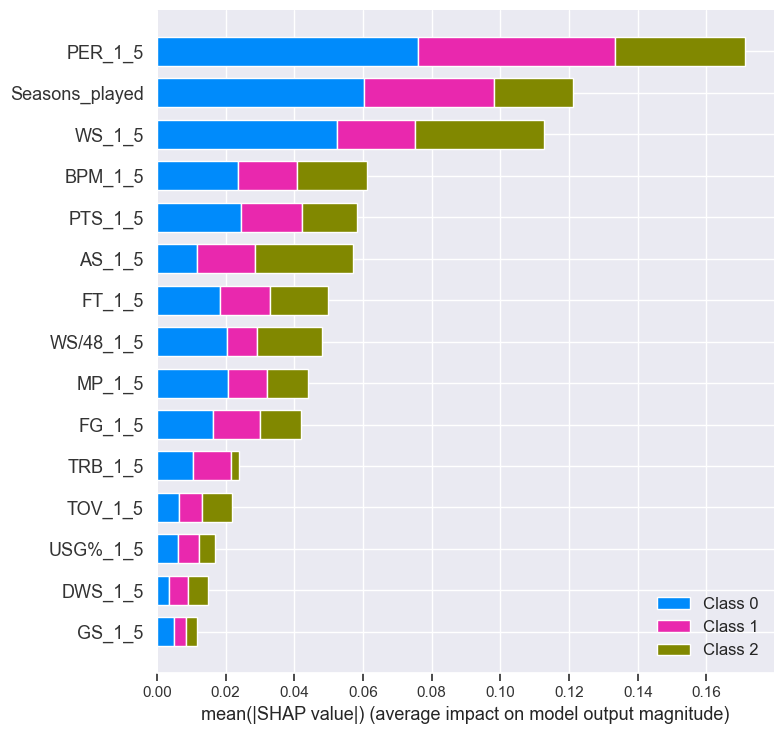

In [4]:
plot_class_probability_distributions(y_test, y_pred_proba)
display_shap_plot(rf, X_train, X_test)

In [33]:
display_lime_plot(rf, X_train, X_test, 0)


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.84      0.67      0.75        88
           1       0.64      0.79      0.71        75
           2       0.78      0.81      0.79        26

    accuracy                           0.74       189
   macro avg       0.75      0.75      0.75       189
weighted avg       0.75      0.74      0.74       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8749534781102858
PR AUC: 0.7839148007008189


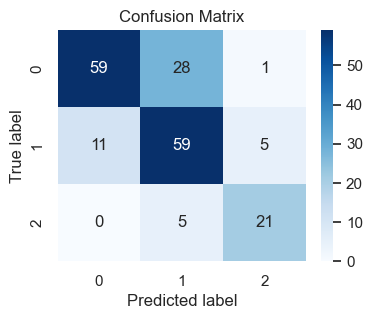

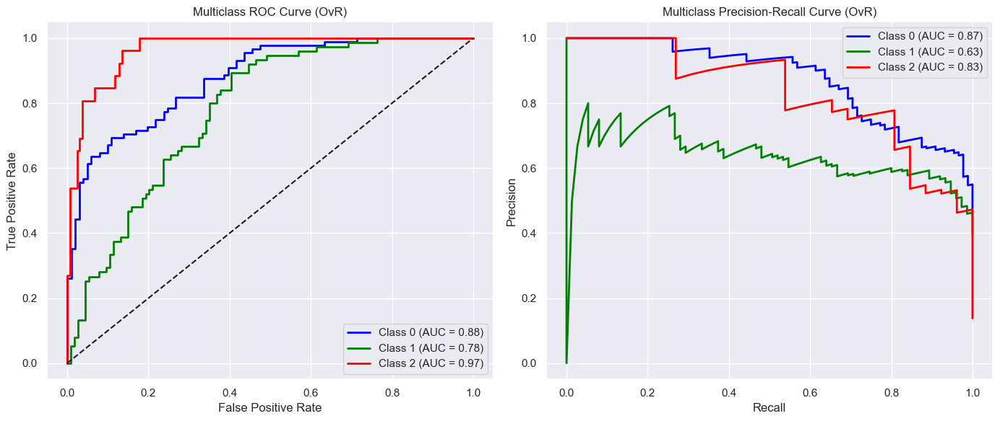


Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.96      0.93      0.94       163
           1       0.63      0.73      0.68        26

    accuracy                           0.90       189
   macro avg       0.79      0.83      0.81       189
weighted avg       0.91      0.90      0.91       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.9369985842378481
PR AUC: 0.7687223380922493


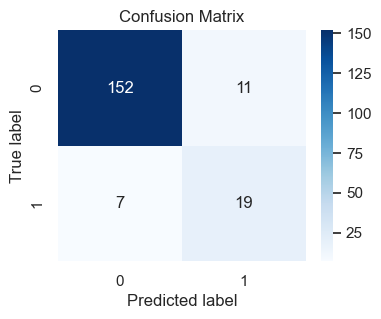

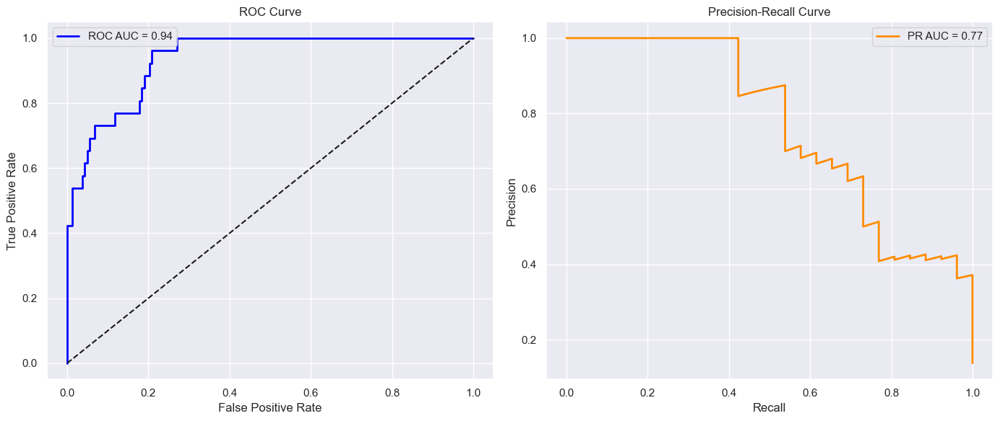


Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.83      0.68      0.75       114
           1       0.62      0.79      0.69        75

    accuracy                           0.72       189
   macro avg       0.73      0.74      0.72       189
weighted avg       0.75      0.72      0.73       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7897076023391812
PR AUC: 0.6656482312598282


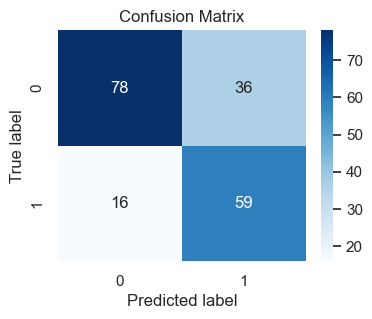

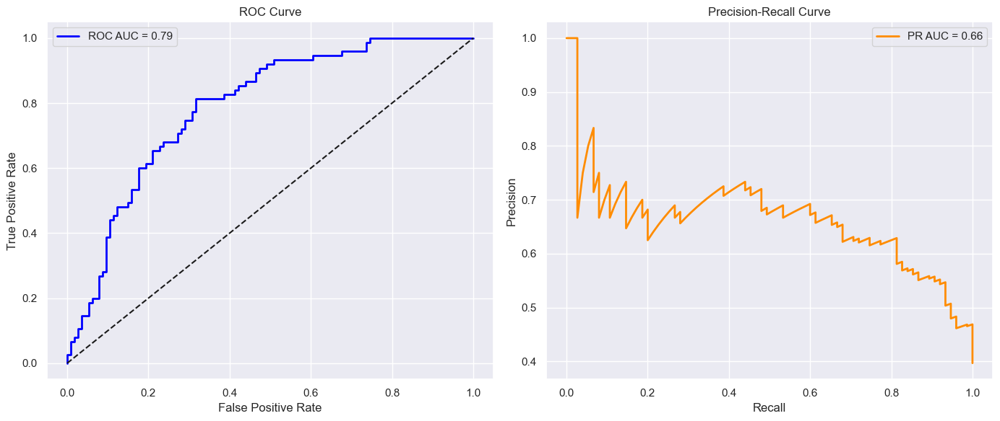


Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.83      0.72      0.77       101
           1       0.72      0.83      0.77        88

    accuracy                           0.77       189
   macro avg       0.78      0.78      0.77       189
weighted avg       0.78      0.77      0.77       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8576732673267327
PR AUC: 0.8157810368699348


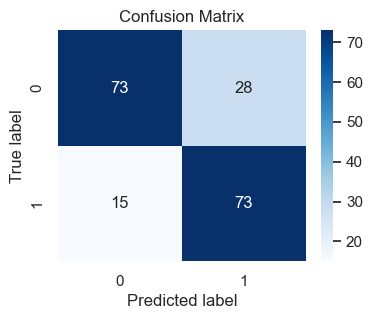

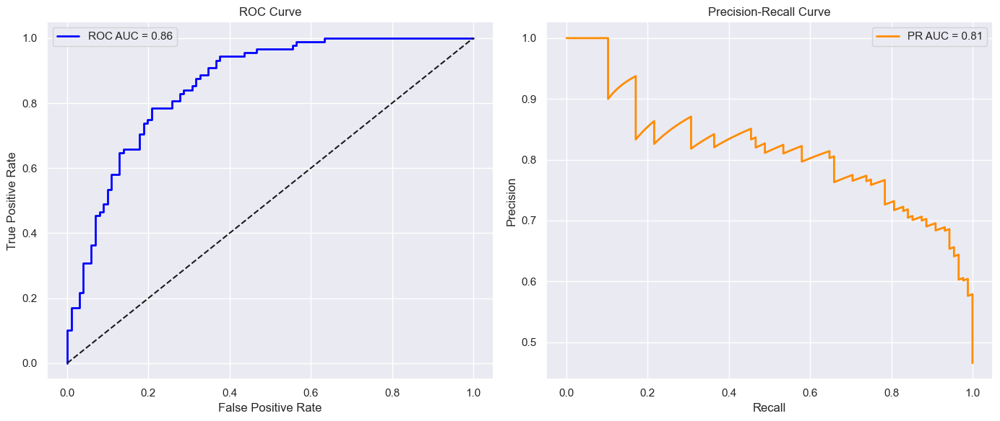

In [34]:
rf = RandomForestClassifier(
    random_state=42, 
    n_estimators=300, 
    min_samples_leaf=2, 
    max_leaf_nodes=15)

ovr = OneVsRestClassifier(rf)
ovr.fit(X_train, y_train)

y_pred_proba = ovr.predict_proba(X_test)

custom_preds = []
for probs in y_pred_proba:
    if probs[2] >= 0.23:        
        custom_preds.append(2)
    elif probs[1] >= 0.33:      
        custom_preds.append(1)
    else:
        custom_preds.append(0) 
        
y_pred_proba = y_pred_proba / y_pred_proba.sum(axis=1, keepdims=True)

calculate_evaluation_metrics(ovr, y_test, custom_preds, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_5_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    rf_bin = RandomForestClassifier(random_state=42, n_estimators=200, min_samples_leaf=2, max_leaf_nodes=25)

    rf_bin.fit(X_train_bin, y_train_bin)
    
    y_pred_proba_bin = rf_bin.predict_proba(X_test_bin)
    y_pred_bin = (y_pred_proba_bin[:,1] >= 0.4).astype(int)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(rf_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)

Number of elements in each class:
Player_class_num
0    351
1    300
2    102
Name: count, dtype: int64

Number of elements in each class after sampling:
Player_class_num
1    351
0    351
2    351
Name: count, dtype: int64

=== Classification Report ===
               precision    recall  f1-score   support

           0       0.74      0.80      0.77        88
           1       0.65      0.61      0.63        75
           2       0.78      0.69      0.73        26

    accuracy                           0.71       189
   macro avg       0.72      0.70      0.71       189
weighted avg       0.71      0.71      0.71       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8778873025153041
PR AUC: 0.7998576042946116


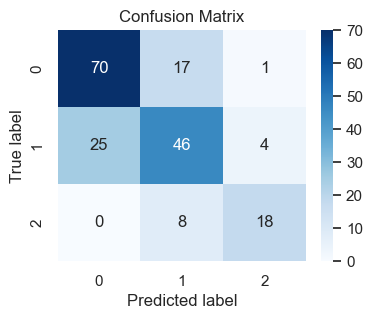

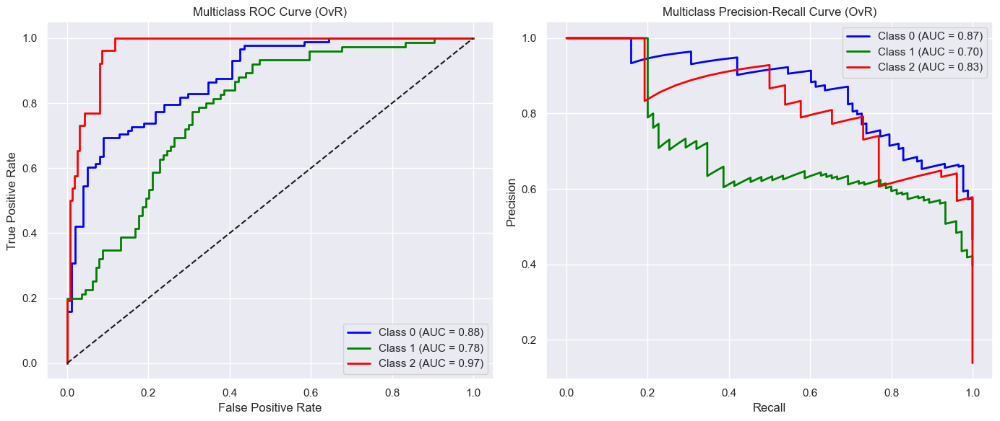

Number of elements in each class:
all-star_class
0    651
1    102
Name: count, dtype: int64

Number of elements in each class after sampling:
all-star_class
0    651
1    651
Name: count, dtype: int64

Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.96      0.87      0.91       163
           1       0.48      0.77      0.59        26

    accuracy                           0.85       189
   macro avg       0.72      0.82      0.75       189
weighted avg       0.89      0.85      0.87       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.9302737140160453
PR AUC: 0.7191643678247086


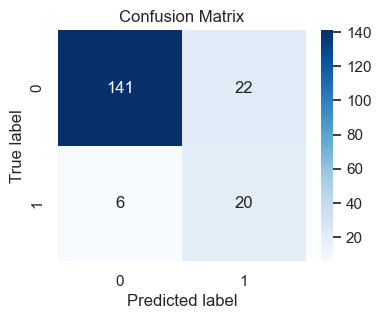

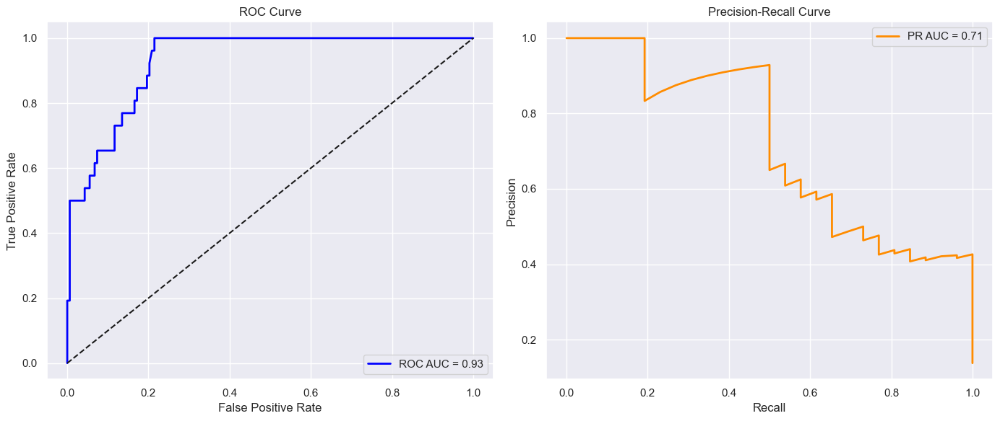

Number of elements in each class:
starter_class
0    453
1    300
Name: count, dtype: int64

Number of elements in each class after sampling:
starter_class
1    453
0    453
Name: count, dtype: int64

Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.79      0.74      0.76       114
           1       0.63      0.69      0.66        75

    accuracy                           0.72       189
   macro avg       0.71      0.72      0.71       189
weighted avg       0.73      0.72      0.72       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7885380116959064
PR AUC: 0.6586074971982303


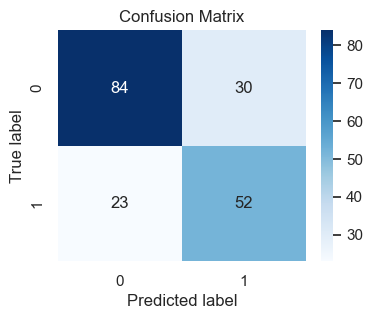

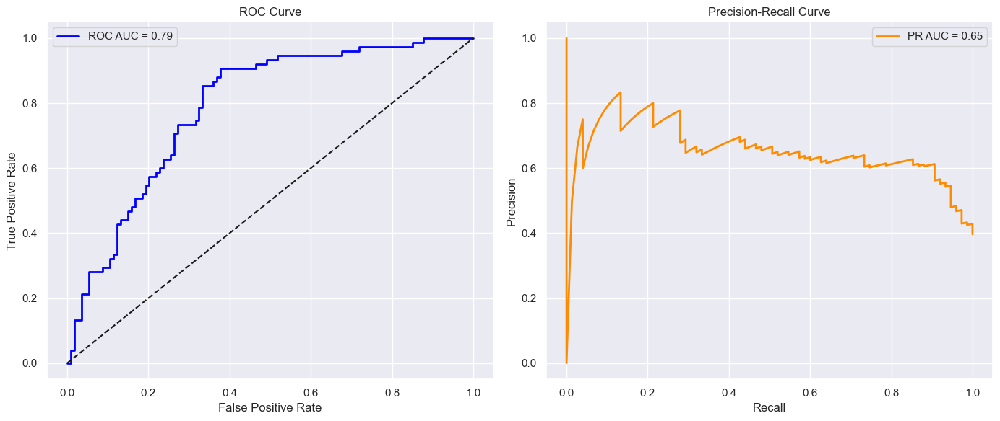

Number of elements in each class:
bench_class
0    402
1    351
Name: count, dtype: int64

Number of elements in each class after sampling:
bench_class
1    402
0    402
Name: count, dtype: int64

Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.79      0.80      0.80       101
           1       0.77      0.76      0.77        88

    accuracy                           0.78       189
   macro avg       0.78      0.78      0.78       189
weighted avg       0.78      0.78      0.78       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.85497299729973
PR AUC: 0.8295148377691535


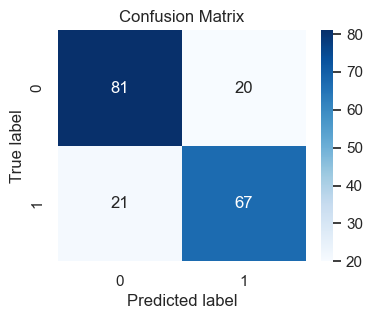

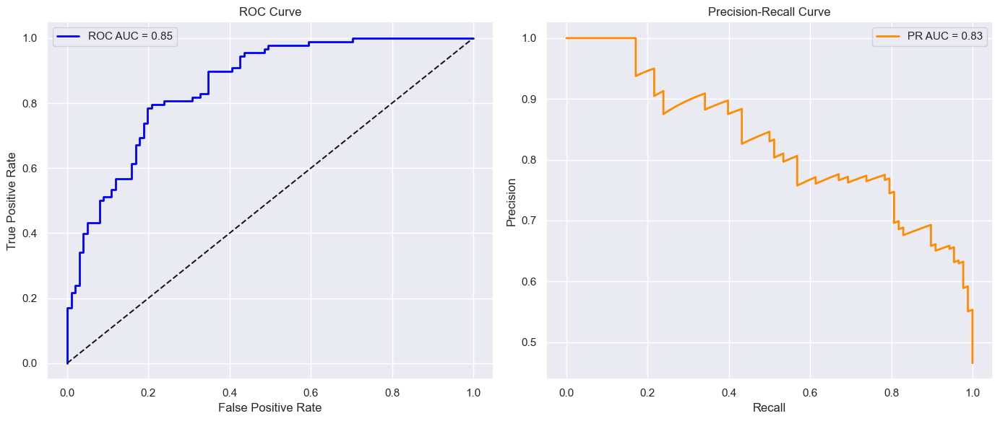

In [6]:
smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X_train, y_train)

print('Number of elements in each class:')
print(y_train.value_counts())
print('\nNumber of elements in each class after sampling:')
print(pd.Series(y_res).value_counts())

rf_smote = RandomForestClassifier(random_state=42, n_estimators=106, min_samples_leaf=2)

rf_smote.fit(X_res, y_res)

y_pred = rf_smote.predict(X_test)
y_pred_proba = rf_smote.predict_proba(X_test)

calculate_evaluation_metrics(rf_smote, y_test, y_pred, y_pred_proba)


for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_5_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    smote = SMOTE(random_state=42)
    X_res_bin, y_res_bin = smote.fit_resample(X_train_bin, y_train_bin)

    print('Number of elements in each class:')
    print(y_train_bin.value_counts())
    print('\nNumber of elements in each class after sampling:')
    print(pd.Series(y_res_bin).value_counts())
    
    rf_smote_bin = RandomForestClassifier(random_state=42, n_estimators=100, min_samples_leaf=2)

    rf_smote_bin.fit(X_res_bin, y_res_bin)

    y_pred_bin = rf_smote_bin.predict(X_test_bin)
    y_pred_proba_bin = rf_smote_bin.predict_proba(X_test_bin)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(rf_smote_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)

<h3>Classification results, input: statistics from the <b>first 3</b> seasons</h3>

In [37]:
df_3 = pd.read_csv('data/final_dataset_3_seasons.csv', low_memory=False)

class_mapping = {'bench': 0, 'starter': 1, 'all-star': 2}
df_3['Player_class_num'] = df_3['Player_class'].map(class_mapping)

final_dataset_3_seasons = df_3[get_selected_features(3)]

X = final_dataset_3_seasons.drop(columns=['Player_class_num'])
y = final_dataset_3_seasons['Player_class_num']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

In [3]:
final_dataset_3_seasons

,Seasons_played,GS_1_3,MP_1_3,FG_1_3,FT_1_3,TRB_1_3,TOV_1_3,PTS_1_3,PER_1_3,USG%_1_3,DWS_1_3,WS_1_3,WS/48_1_3,BPM_1_3,AS_1_3,Player_class_num
0,8,37.000,25.000,6.133,1.733,2.000,1.767,14.533,13.467,0.265,0.900,1.567,0.026,-2.733,0,0
1,11,67.667,37.133,7.533,6.100,7.167,3.200,21.333,19.733,0.283,0.900,4.800,0.090,0.600,0,1
2,8,50.667,30.267,4.567,2.633,2.800,1.800,13.200,15.800,0.174,2.533,6.167,0.124,2.200,0,1
3,11,55.667,21.767,2.500,1.300,6.100,1.133,6.333,13.600,0.129,2.133,4.500,0.127,-1.100,0,1
4,8,39.667,25.567,4.000,2.533,7.667,1.767,10.567,17.967,0.176,3.067,6.500,0.162,1.600,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
937,16,46.000,29.133,5.200,1.533,4.800,1.467,12.433,15.267,0.198,1.900,4.033,0.096,-0.500,0,1
938,7,68.000,33.300,7.767,6.633,3.967,4.233,24.667,21.300,0.321,0.867,5.467,0.119,2.333,1,1
939,8,36.000,21.867,2.700,2.067,5.433,1.000,7.433,14.433,0.166,2.367,4.233,0.127,-0.900,0,1
940,6,41.000,20.833,3.167,1.567,5.133,1.000,7.933,15.100,0.175,1.433,3.700,0.116,-1.767,0,1



=== Classification Report ===
               precision    recall  f1-score   support

           0       0.70      0.81      0.75        88
           1       0.59      0.51      0.55        75
           2       0.61      0.54      0.57        26

    accuracy                           0.65       189
   macro avg       0.63      0.62      0.62       189
weighted avg       0.64      0.65      0.64       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8288939739291564
PR AUC: 0.7042050747383715


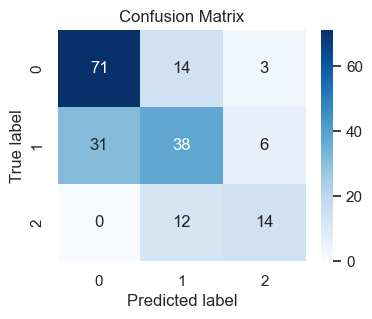

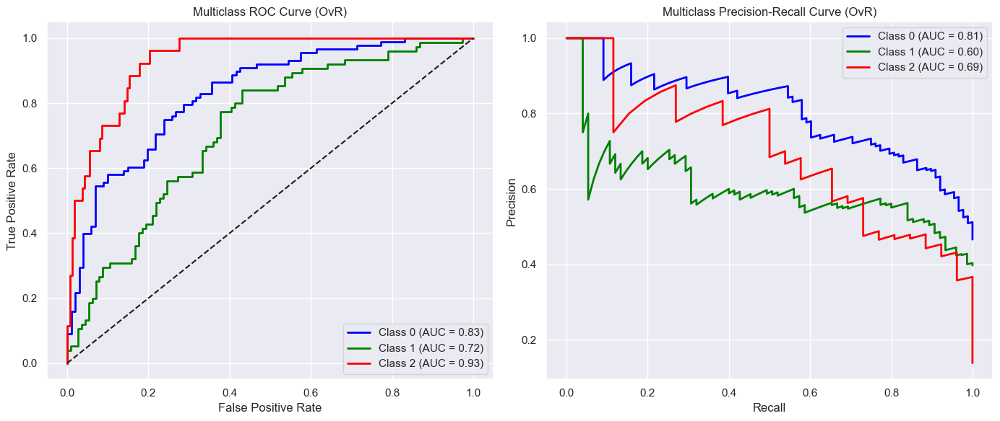


Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.93      0.91      0.92       163
           1       0.52      0.58      0.55        26

    accuracy                           0.87       189
   macro avg       0.72      0.75      0.73       189
weighted avg       0.87      0.87      0.87       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8839075035394054
PR AUC: 0.630893379502732


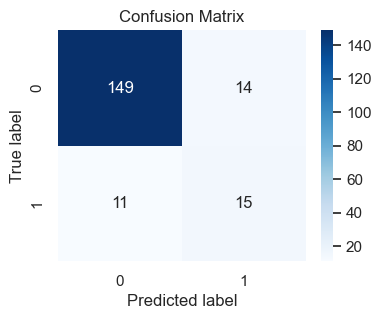

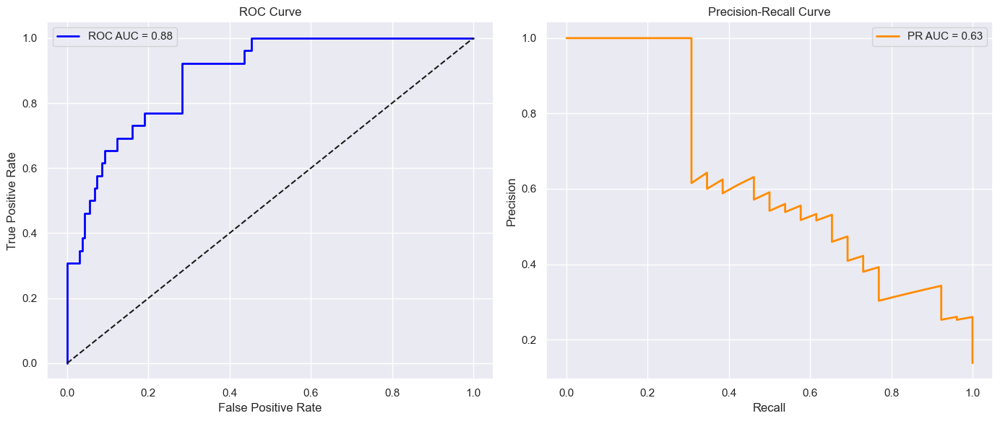


Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.79      0.69      0.74       114
           1       0.61      0.72      0.66        75

    accuracy                           0.70       189
   macro avg       0.70      0.71      0.70       189
weighted avg       0.72      0.70      0.71       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7617543859649123
PR AUC: 0.6224146045004134


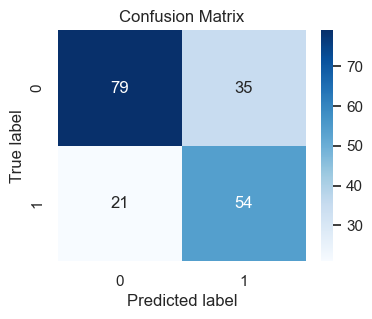

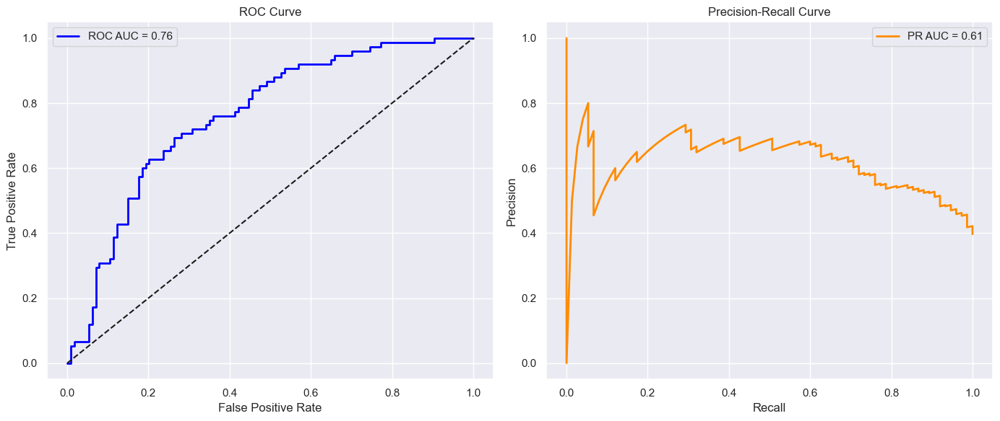


Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.78      0.76      0.77       101
           1       0.73      0.75      0.74        88

    accuracy                           0.76       189
   macro avg       0.76      0.76      0.76       189
weighted avg       0.76      0.76      0.76       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.816944194419442
PR AUC: 0.7670005471381303


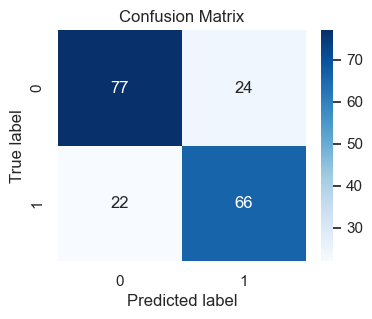

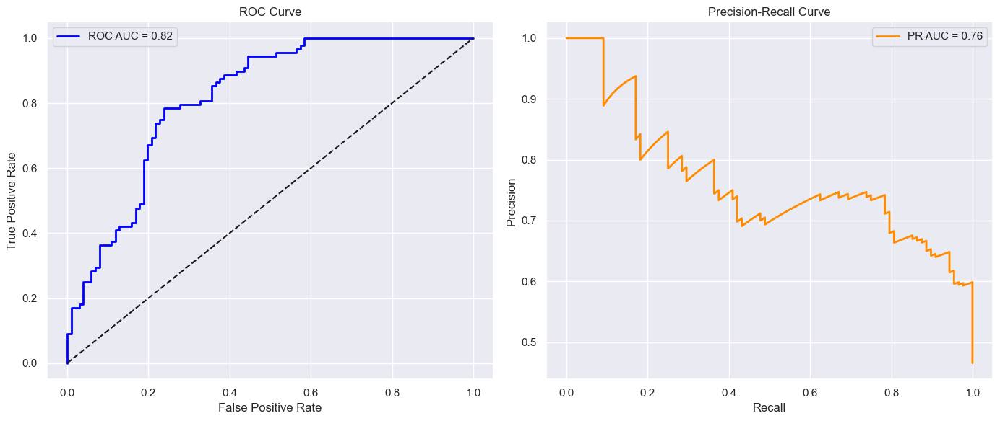

In [97]:
rf = RandomForestClassifier(
    random_state=42, 
    n_estimators=200, 
    min_samples_leaf=3, 
    max_leaf_nodes=10, 
    class_weight='balanced')

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
y_pred_proba = rf.predict_proba(X_test)

calculate_evaluation_metrics(rf, y_test, y_pred, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_3_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    rf_bin = RandomForestClassifier(
        random_state=42, 
        n_estimators=200, 
        min_samples_leaf=2, 
        max_leaf_nodes=25, 
        class_weight='balanced')

    rf_bin.fit(X_train_bin, y_train_bin)

    y_pred_bin = rf_bin.predict(X_test_bin)
    y_pred_proba_bin = rf_bin.predict_proba(X_test_bin)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(rf_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)

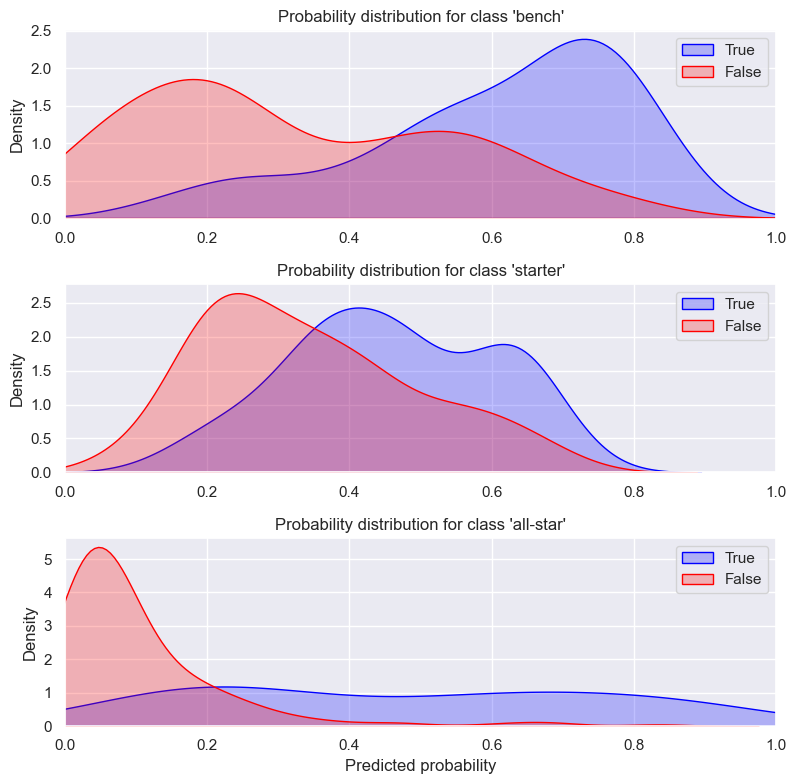

PermutationExplainer explainer: 190it [06:40,  2.12s/it]                         


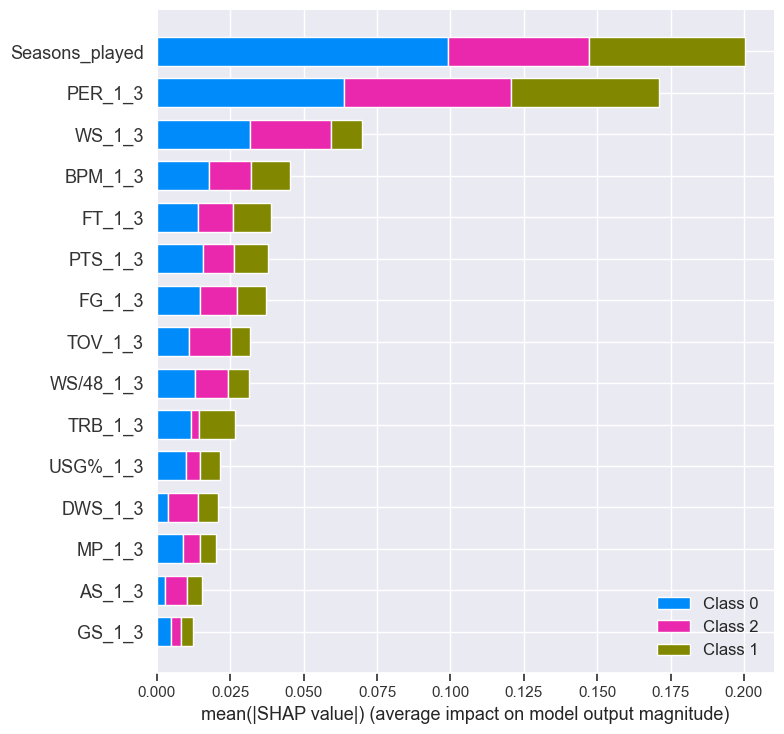

In [4]:
plot_class_probability_distributions(y_test, y_pred_proba)
display_shap_plot(rf, X_train, X_test)

In [39]:
display_lime_plot(rf, X_train, X_test, 0)


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.86      0.57      0.68        88
           1       0.56      0.81      0.67        75
           2       0.61      0.54      0.57        26

    accuracy                           0.66       189
   macro avg       0.68      0.64      0.64       189
weighted avg       0.71      0.66      0.66       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8266369879662845
PR AUC: 0.6975036750783117


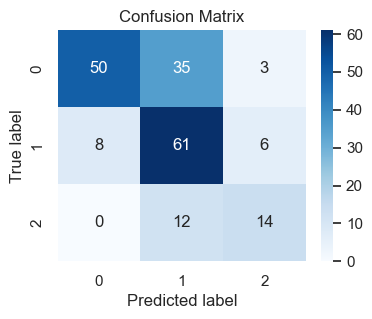

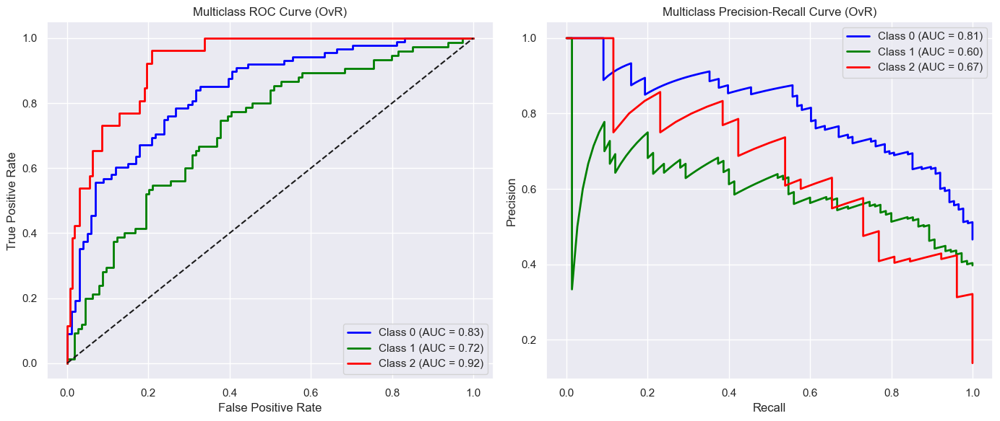


Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.92      0.93      0.93       163
           1       0.54      0.50      0.52        26

    accuracy                           0.87       189
   macro avg       0.73      0.72      0.72       189
weighted avg       0.87      0.87      0.87       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8924020764511562
PR AUC: 0.6099661948315639


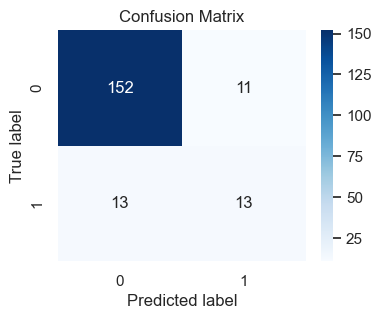

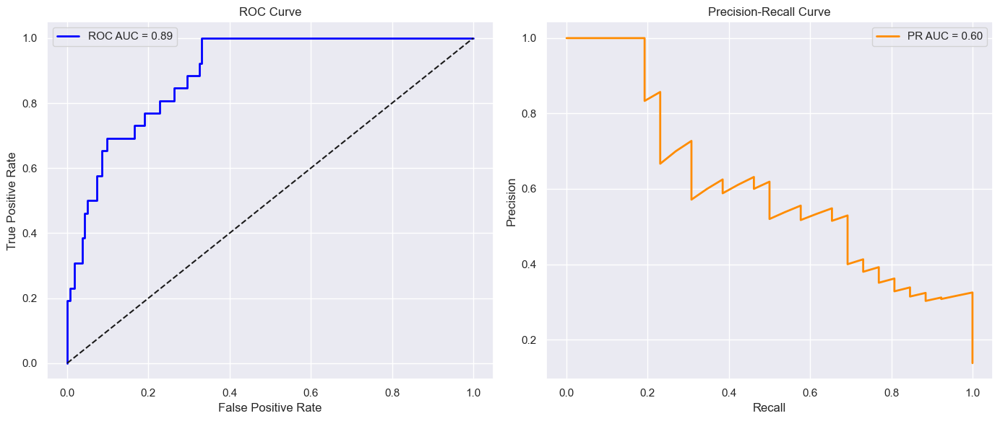


Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.86      0.53      0.65       114
           1       0.55      0.87      0.67        75

    accuracy                           0.66       189
   macro avg       0.70      0.70      0.66       189
weighted avg       0.73      0.66      0.66       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7698245614035089
PR AUC: 0.6428497531258517


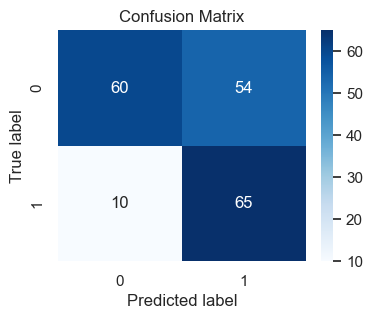

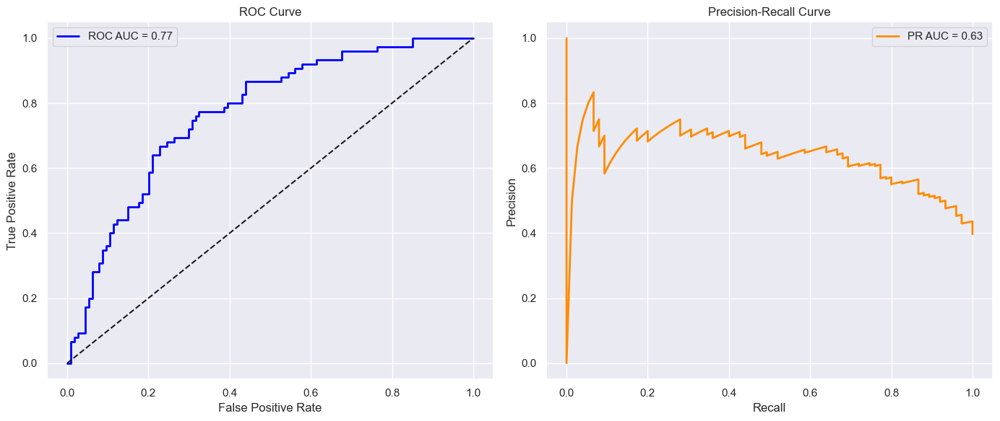


Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.81      0.64      0.72       101
           1       0.67      0.83      0.74        88

    accuracy                           0.73       189
   macro avg       0.74      0.74      0.73       189
weighted avg       0.75      0.73      0.73       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8202070207020702
PR AUC: 0.7693613969639295


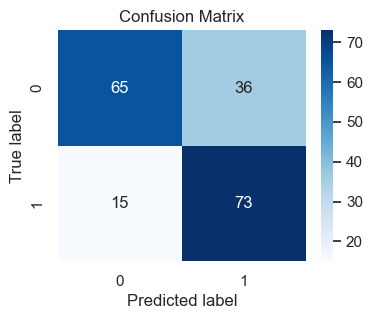

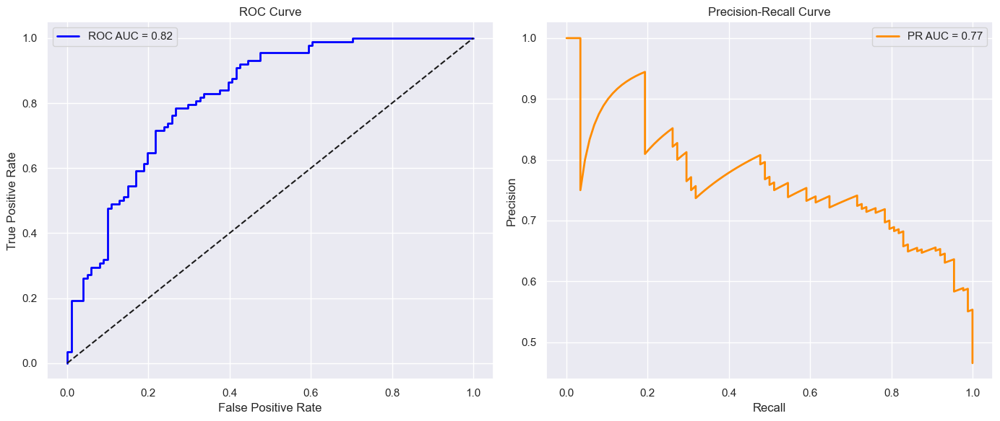

In [101]:
rf = RandomForestClassifier(
    random_state=42, 
    n_estimators=200, 
    min_samples_leaf=3, 
    max_leaf_nodes=10, 
    class_weight={0: 1, 1: 2, 2: 6})

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
y_pred_proba = rf.predict_proba(X_test)

calculate_evaluation_metrics(rf, y_test, y_pred, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_3_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    rf_bin = RandomForestClassifier(
        random_state=42, 
        n_estimators=200, 
        min_samples_leaf=3, 
        max_leaf_nodes=10, 
        class_weight={0: 1, 1: 2, 2: 6})

    rf_bin.fit(X_train_bin, y_train_bin)

    y_pred_bin = rf_bin.predict(X_test_bin)
    y_pred_proba_bin = rf_bin.predict_proba(X_test_bin)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(rf_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.73      0.65      0.69        88
           1       0.56      0.64      0.60        75
           2       0.69      0.69      0.69        26

    accuracy                           0.65       189
   macro avg       0.66      0.66      0.66       189
weighted avg       0.66      0.65      0.65       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8239646288134606
PR AUC: 0.6980412860802105


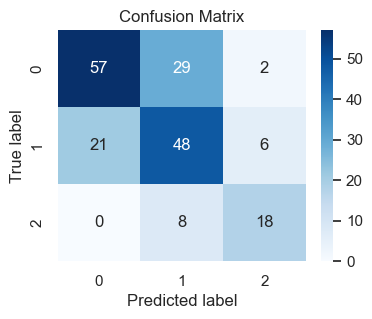

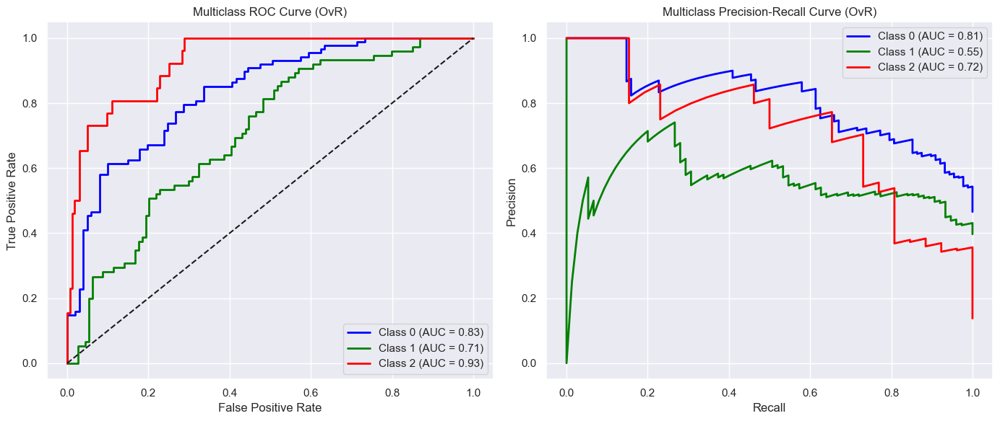


Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.95      0.85      0.90       163
           1       0.43      0.69      0.53        26

    accuracy                           0.83       189
   macro avg       0.69      0.77      0.71       189
weighted avg       0.87      0.83      0.85       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8905143935818782
PR AUC: 0.6332939525065358


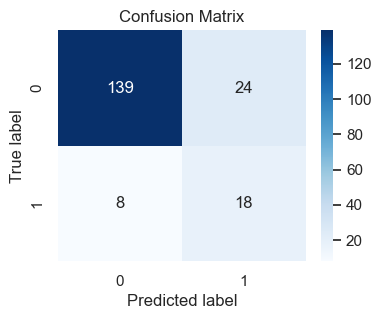

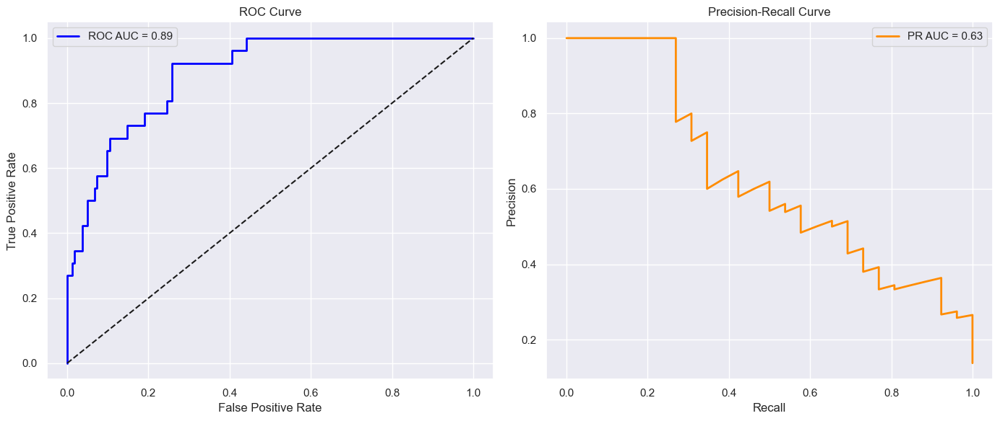


Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.85      0.48      0.61       114
           1       0.52      0.87      0.65        75

    accuracy                           0.63       189
   macro avg       0.69      0.67      0.63       189
weighted avg       0.72      0.63      0.63       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7619883040935673
PR AUC: 0.63306448855966


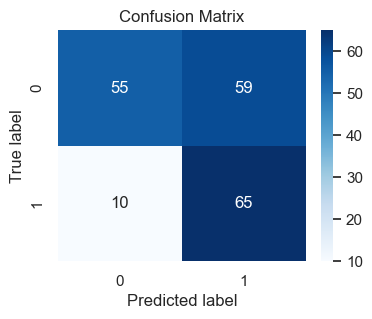

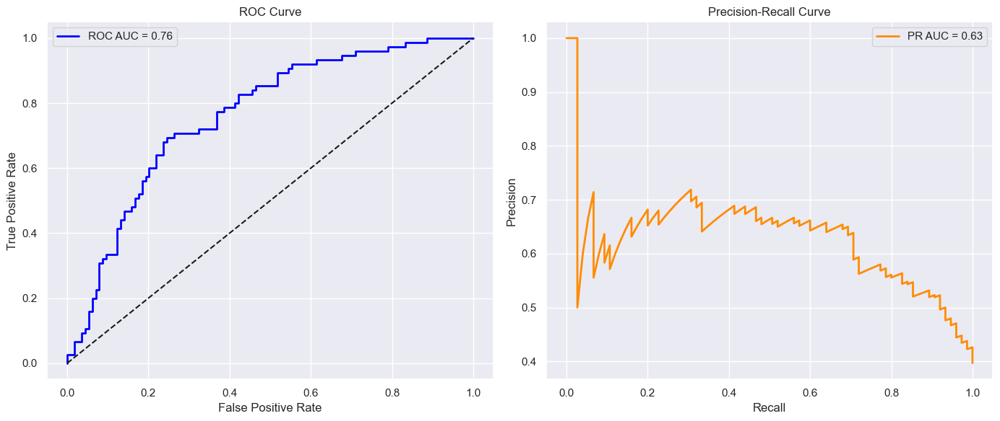


Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.81      0.63      0.71       101
           1       0.66      0.83      0.74        88

    accuracy                           0.72       189
   macro avg       0.74      0.73      0.72       189
weighted avg       0.74      0.72      0.72       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.819081908190819
PR AUC: 0.7683363128384435


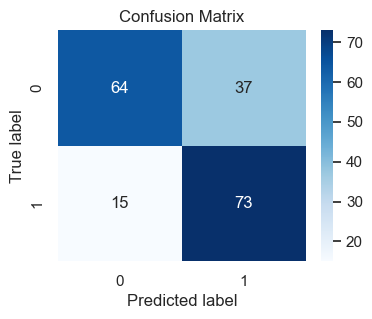

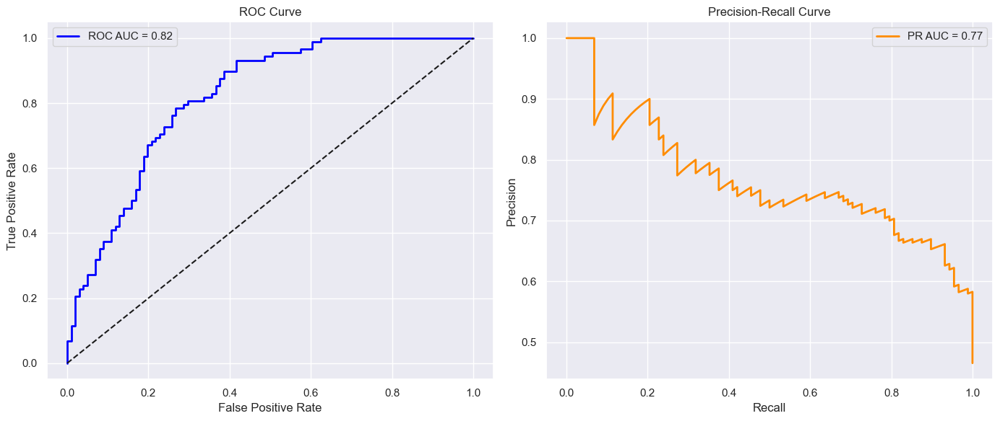

In [105]:
rf = RandomForestClassifier(
    random_state=42, 
    n_estimators=200, 
    min_samples_leaf=3, 
    max_leaf_nodes=15)
ovr = OneVsRestClassifier(rf)
ovr.fit(X_train, y_train)

y_pred_proba = ovr.predict_proba(X_test)

custom_preds = []
for probs in y_pred_proba:
    if probs[2] >= 0.19:        
        custom_preds.append(2)
    elif probs[1] >= 0.36:      
        custom_preds.append(1)
    else:
        custom_preds.append(0) 
        
y_pred_proba = y_pred_proba / y_pred_proba.sum(axis=1, keepdims=True)

calculate_evaluation_metrics(ovr, y_test, custom_preds, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_3_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    rf_bin = RandomForestClassifier(
        random_state=42, 
        n_estimators=200, 
        min_samples_leaf=3, 
        max_leaf_nodes=15, 
        class_weight='balanced')

    rf_bin.fit(X_train_bin, y_train_bin)

    y_pred_proba_bin = rf_bin.predict_proba(X_test_bin)
    y_pred_bin = (y_pred_proba_bin[:,1] >= 0.4).astype(int)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(rf_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)

Number of elements in each class:
Player_class_num
0    351
1    300
2    102
Name: count, dtype: int64

Number of elements in each class after sampling:
Player_class_num
1    351
0    351
2    351
Name: count, dtype: int64

=== Classification Report ===
               precision    recall  f1-score   support

           0       0.69      0.80      0.74        88
           1       0.60      0.49      0.54        75
           2       0.58      0.58      0.58        26

    accuracy                           0.65       189
   macro avg       0.62      0.62      0.62       189
weighted avg       0.64      0.65      0.64       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.833663999630633
PR AUC: 0.7095608490724054


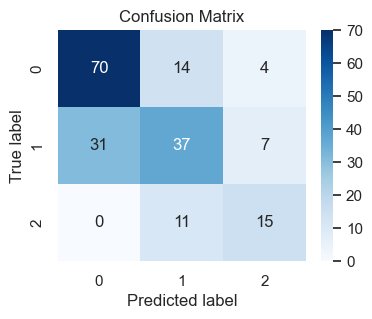

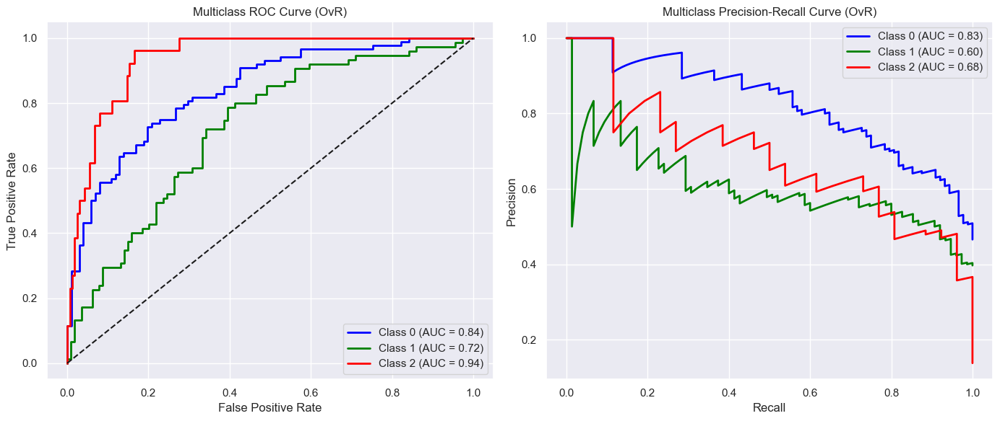

Number of elements in each class:
all-star_class
0    651
1    102
Name: count, dtype: int64

Number of elements in each class after sampling:
all-star_class
0    651
1    651
Name: count, dtype: int64

Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.95      0.83      0.89       163
           1       0.40      0.73      0.52        26

    accuracy                           0.81       189
   macro avg       0.68      0.78      0.70       189
weighted avg       0.88      0.81      0.84       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8947616800377537
PR AUC: 0.6197219792880213


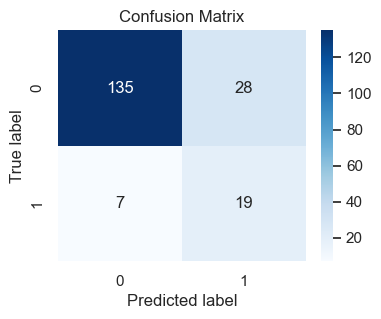

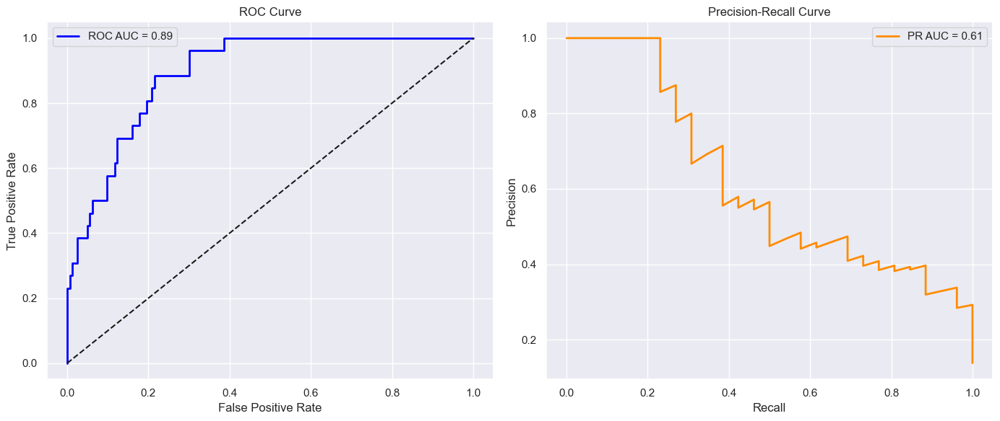

Number of elements in each class:
starter_class
0    453
1    300
Name: count, dtype: int64

Number of elements in each class after sampling:
starter_class
1    453
0    453
Name: count, dtype: int64

Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.80      0.63      0.71       114
           1       0.58      0.76      0.66        75

    accuracy                           0.68       189
   macro avg       0.69      0.70      0.68       189
weighted avg       0.71      0.68      0.69       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7635087719298246
PR AUC: 0.6552812460933499


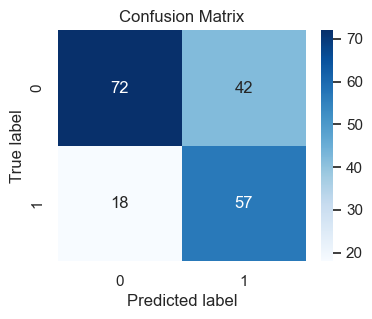

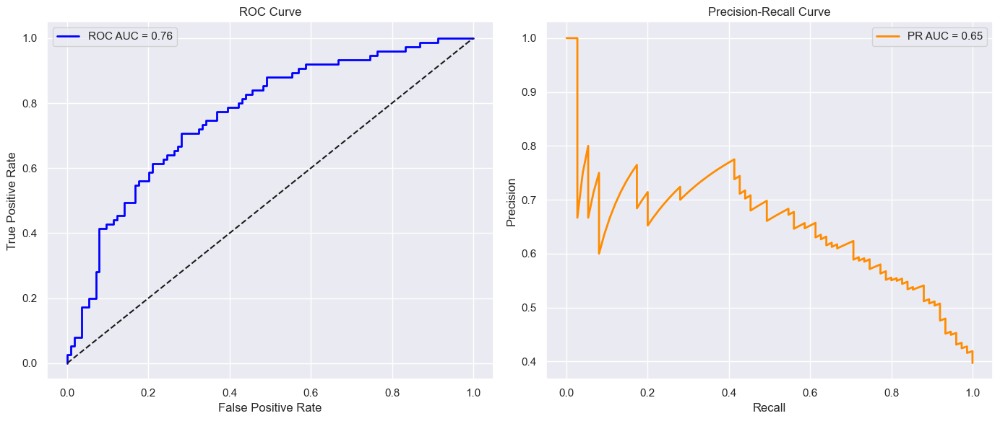

Number of elements in each class:
bench_class
0    402
1    351
Name: count, dtype: int64

Number of elements in each class after sampling:
bench_class
1    402
0    402
Name: count, dtype: int64

Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.75      0.75      0.75       101
           1       0.72      0.72      0.72        88

    accuracy                           0.74       189
   macro avg       0.73      0.73      0.73       189
weighted avg       0.74      0.74      0.74       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.8200945094509451
PR AUC: 0.7763041843546534


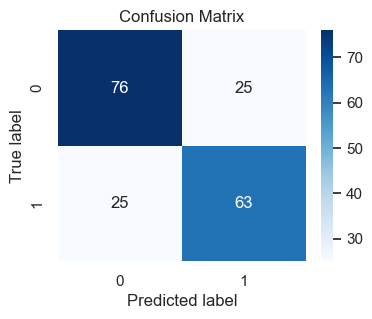

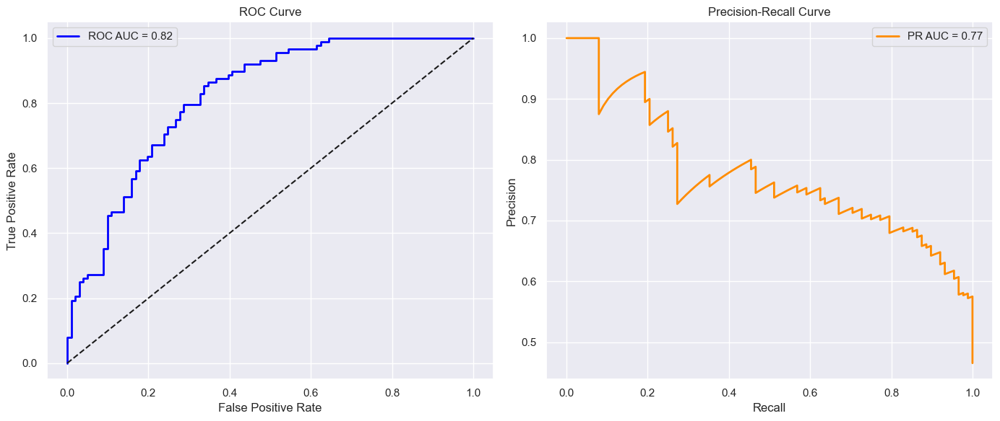

In [65]:
smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X_train, y_train)

print('Number of elements in each class:')
print(y_train.value_counts())
print('\nNumber of elements in each class after sampling:')
print(pd.Series(y_res).value_counts())

rf_smote = RandomForestClassifier(random_state=42, n_estimators=200, min_samples_leaf=3, max_leaf_nodes=10)

rf_smote.fit(X_res, y_res)

y_pred = rf_smote.predict(X_test)
y_pred_proba = rf_smote.predict_proba(X_test)

calculate_evaluation_metrics(rf_smote, y_test, y_pred, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_3_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    smote = SMOTE(random_state=42)
    X_res_bin, y_res_bin = smote.fit_resample(X_train_bin, y_train_bin)

    print('Number of elements in each class:')
    print(y_train_bin.value_counts())
    print('\nNumber of elements in each class after sampling:')
    print(pd.Series(y_res_bin).value_counts())
    
    rf_smote_bin = RandomForestClassifier(random_state=42, n_estimators=200, min_samples_leaf=3, max_leaf_nodes=10)

    rf_smote_bin.fit(X_res_bin, y_res_bin)

    y_pred_bin = rf_smote_bin.predict(X_test_bin)
    y_pred_proba_bin = rf_smote_bin.predict_proba(X_test_bin)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(rf_smote_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)

<h3>Classification results, input: statistics from the <b>rookie</b> season</h3>

In [40]:
df_1 = pd.read_csv('data/final_dataset_1_seasons.csv', low_memory=False)

class_mapping = {'bench': 0, 'starter': 1, 'all-star': 2}
df_1['Player_class_num'] = df_1['Player_class'].map(class_mapping)

final_dataset_1_seasons = df_1[get_selected_features(1)]

X = final_dataset_1_seasons.drop(columns=['Player_class_num'])
y = final_dataset_1_seasons['Player_class_num']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

In [90]:
final_dataset_1_seasons

,Seasons_played,GS_1_1,MP_1_1,FG_1_1,FT_1_1,TRB_1_1,TOV_1_1,PTS_1_1,PER_1_1,USG%_1_1,DWS_1_1,WS_1_1,WS/48_1_1,BPM_1_1,AS_1_1,Player_class_num
0,8,19.0,22.5,6.2,1.3,1.8,1.6,14.1,12.2,0.272,-0.3,-1.0,-0.031,-5.0,0,0
1,11,71.0,35.0,6.9,4.8,6.9,2.8,18.7,17.4,0.276,1.2,2.9,0.049,-1.8,0,1
2,8,0.0,20.7,2.5,1.7,2.0,1.3,7.2,14.3,0.163,1.5,2.7,0.099,1.2,0,1
3,11,20.0,14.8,1.1,1.0,4.1,0.9,3.3,11.2,0.117,1.9,2.9,0.114,-2.2,0,1
4,8,19.0,19.8,2.5,1.9,5.5,1.0,6.9,15.7,0.159,1.9,4.2,0.148,-0.4,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
937,16,22.0,21.0,3.6,1.0,4.2,0.9,8.2,16.5,0.174,2.0,4.5,0.140,0.5,0,1
938,7,81.0,30.9,6.5,4.2,3.7,3.8,19.1,17.0,0.284,0.7,3.3,0.062,-0.6,0,1
939,8,3.0,17.3,2.1,1.8,4.3,1.1,6.0,13.1,0.189,2.2,2.6,0.090,-2.0,0,1
940,6,55.0,26.4,3.2,1.6,5.7,1.2,7.9,11.0,0.159,1.2,2.0,0.048,-4.0,0,1



=== Classification Report ===
               precision    recall  f1-score   support

           0       0.70      0.78      0.74        88
           1       0.54      0.47      0.50        75
           2       0.48      0.46      0.47        26

    accuracy                           0.61       189
   macro avg       0.57      0.57      0.57       189
weighted avg       0.60      0.61      0.61       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7699112769667634
PR AUC: 0.6100008925201058


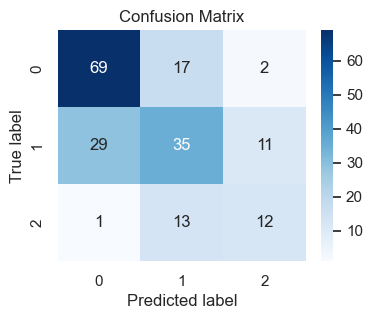

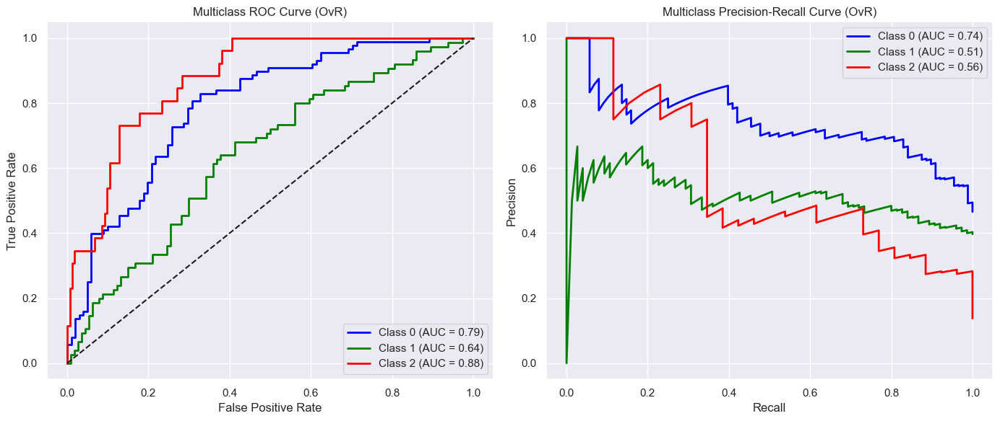


Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.93      0.86      0.89       163
           1       0.39      0.58      0.47        26

    accuracy                           0.82       189
   macro avg       0.66      0.72      0.68       189
weighted avg       0.85      0.82      0.83       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.819490325625295
PR AUC: 0.51104024099766


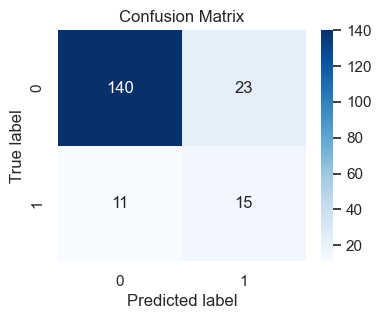

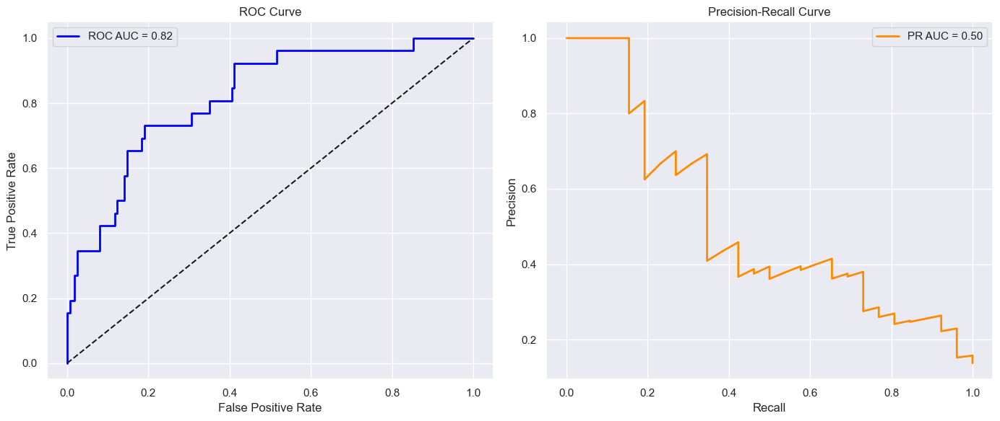


Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.70      0.64      0.67       114
           1       0.52      0.59      0.55        75

    accuracy                           0.62       189
   macro avg       0.61      0.61      0.61       189
weighted avg       0.63      0.62      0.62       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.6745029239766083
PR AUC: 0.5466689435062136


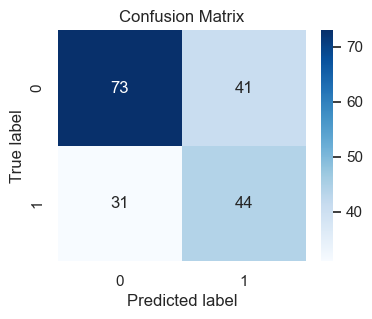

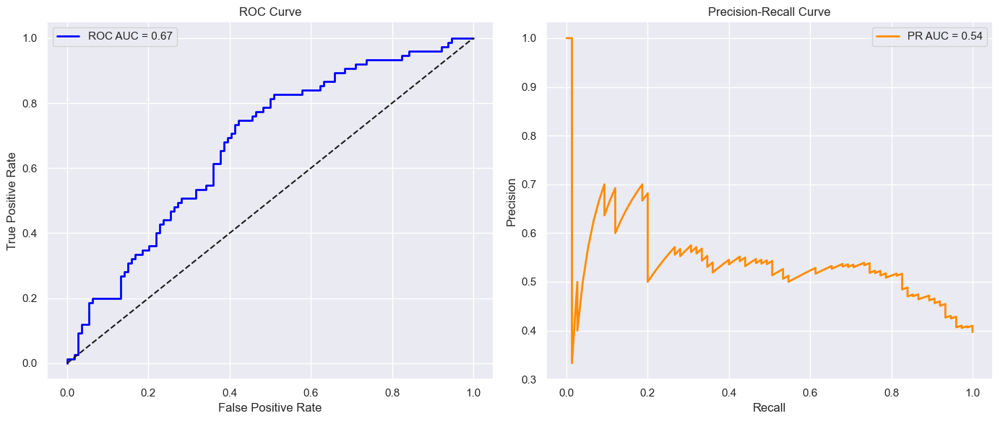


Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.78      0.66      0.72       101
           1       0.67      0.78      0.72        88

    accuracy                           0.72       189
   macro avg       0.72      0.72      0.72       189
weighted avg       0.73      0.72      0.72       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7865661566156615
PR AUC: 0.7318350207707931


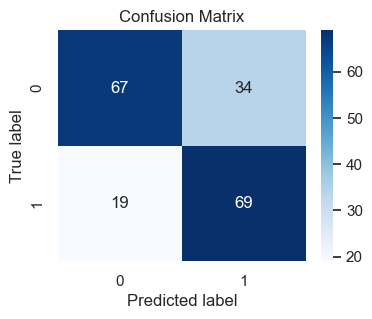

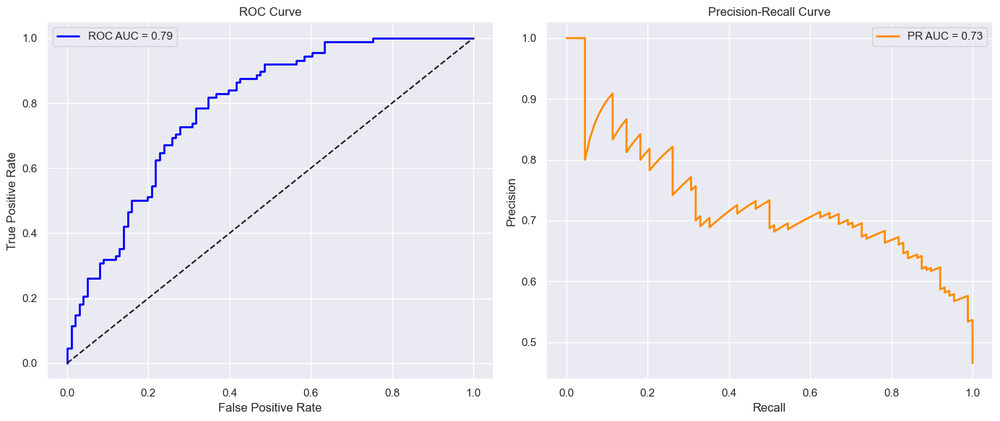

In [41]:
rf = RandomForestClassifier(
    random_state=42, 
    n_estimators=200, 
    min_samples_leaf=3, 
    max_leaf_nodes=15, 
    class_weight='balanced')

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)
y_pred_proba = rf.predict_proba(X_test)

calculate_evaluation_metrics(rf, y_test, y_pred, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_1_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    rf_bin = RandomForestClassifier(
        random_state=42, 
        n_estimators=200, 
        min_samples_leaf=3, 
        max_leaf_nodes=15, 
        class_weight='balanced')

    rf_bin.fit(X_train_bin, y_train_bin)

    y_pred_bin = rf_bin.predict(X_test_bin)
    y_pred_proba_bin = rf_bin.predict_proba(X_test_bin)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(rf_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)

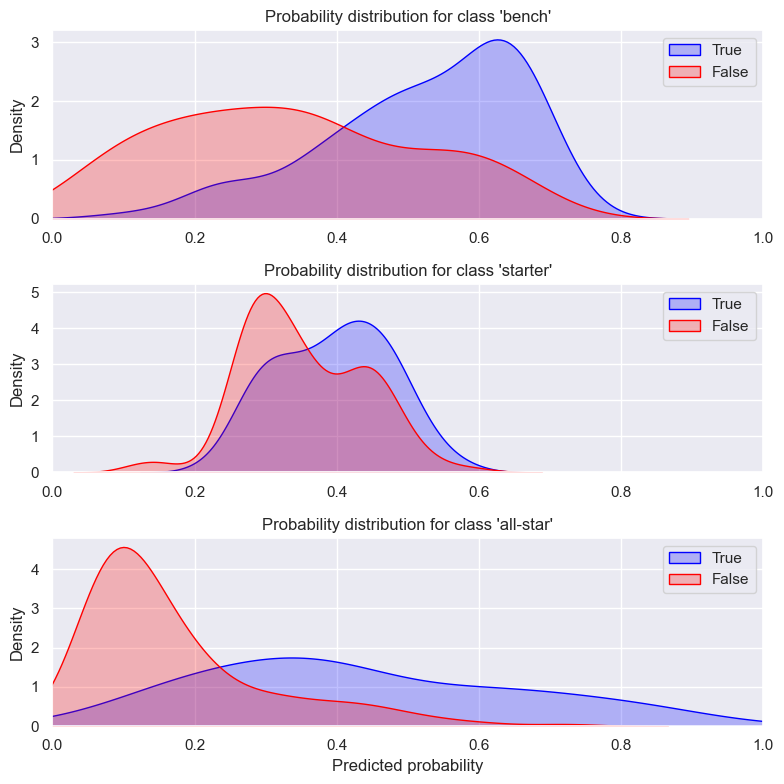

PermutationExplainer explainer: 190it [04:13,  1.40s/it]                         


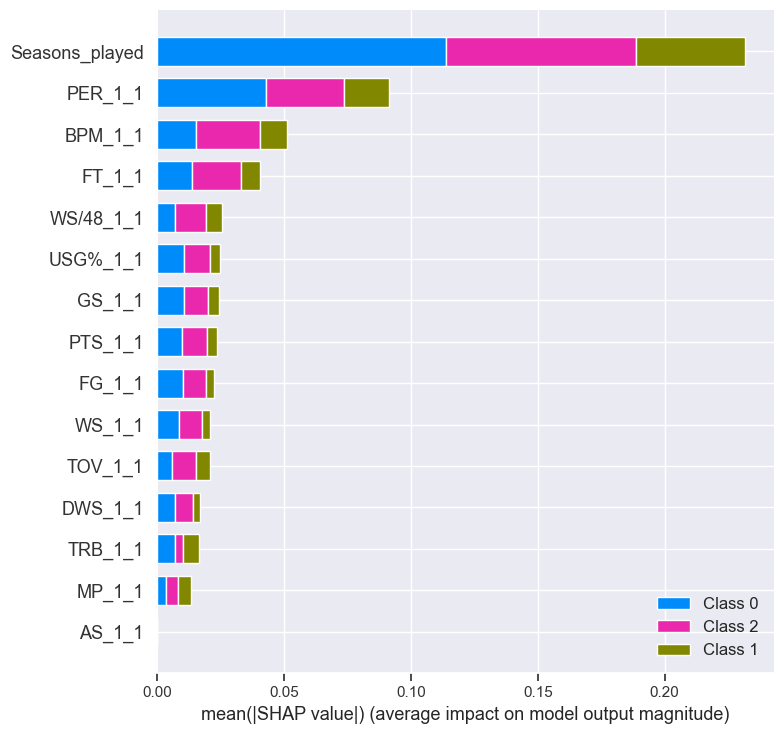

In [122]:
plot_class_probability_distributions(y_test, y_pred_proba)
display_shap_plot(rf, X_train, X_test)

In [42]:
display_lime_plot(rf, X_train, X_test, 0)


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.68      0.70      0.69        88
           1       0.53      0.52      0.53        75
           2       0.48      0.46      0.47        26

    accuracy                           0.60       189
   macro avg       0.57      0.56      0.56       189
weighted avg       0.60      0.60      0.60       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7630660784383166
PR AUC: 0.600911113775883


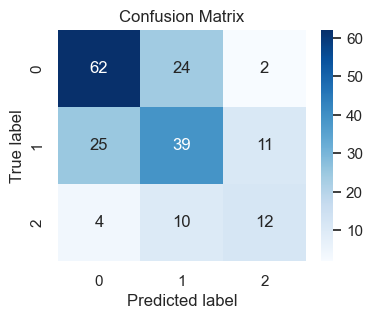

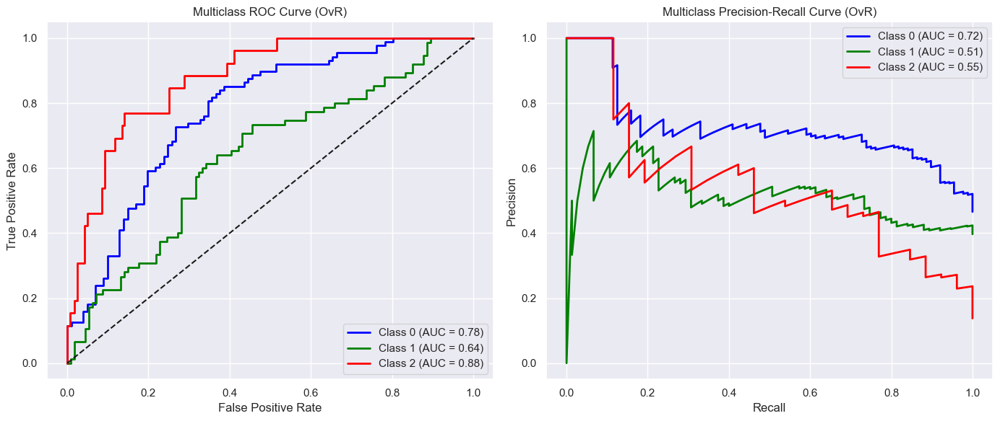


Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.95      0.79      0.86       163
           1       0.36      0.73      0.48        26

    accuracy                           0.78       189
   macro avg       0.65      0.76      0.67       189
weighted avg       0.87      0.78      0.81       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.819490325625295
PR AUC: 0.51104024099766


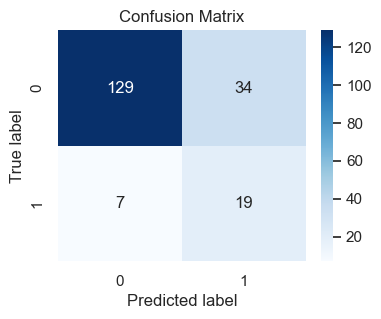

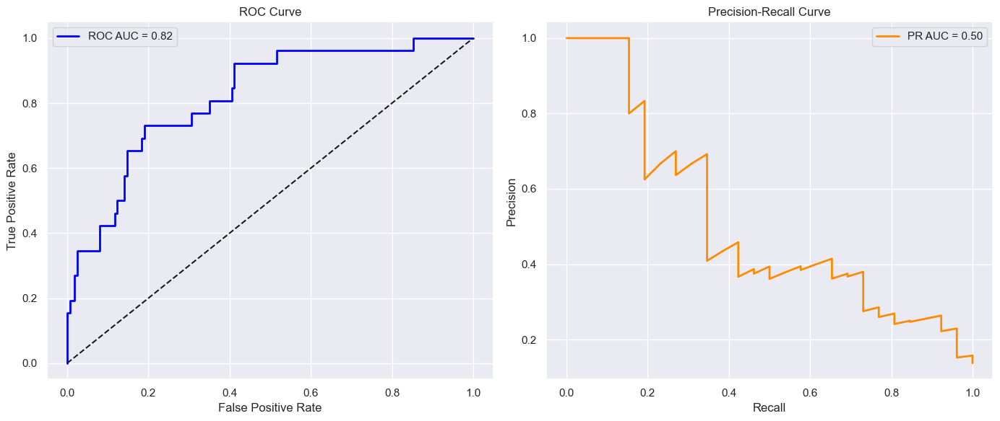


Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.81      0.47      0.60       114
           1       0.51      0.83      0.63        75

    accuracy                           0.61       189
   macro avg       0.66      0.65      0.61       189
weighted avg       0.69      0.61      0.61       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.6745029239766083
PR AUC: 0.5466689435062136


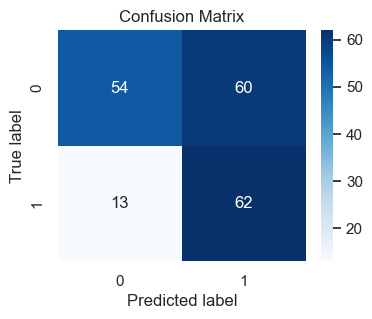

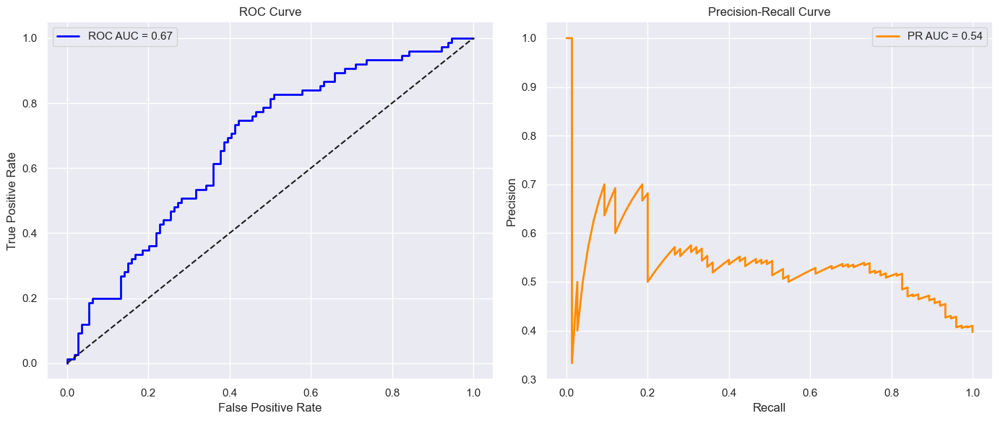


Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.88      0.51      0.65       101
           1       0.62      0.92      0.74        88

    accuracy                           0.70       189
   macro avg       0.75      0.72      0.70       189
weighted avg       0.76      0.70      0.69       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7865661566156615
PR AUC: 0.7318350207707931


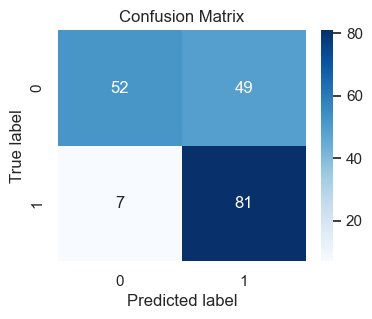

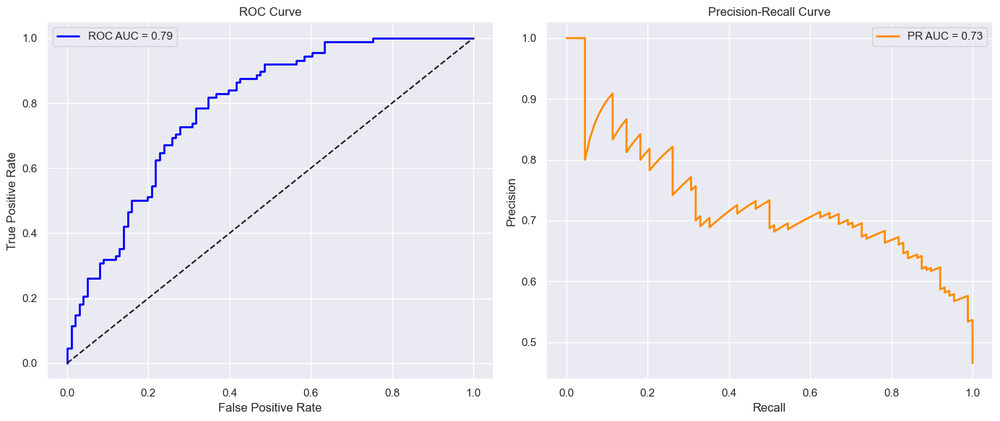

In [109]:
rf = RandomForestClassifier(random_state=42, n_estimators=200, min_samples_leaf=3, max_leaf_nodes=15)
ovr = OneVsRestClassifier(rf)
ovr.fit(X_train, y_train)

y_pred_proba = ovr.predict_proba(X_test)

custom_preds = []
for probs in y_pred_proba:
    if probs[2] >= 0.23:        
        custom_preds.append(2)
    elif probs[1] >= 0.4:      
        custom_preds.append(1)
    else:
        custom_preds.append(0) 
        
y_pred_proba = y_pred_proba / y_pred_proba.sum(axis=1, keepdims=True)

calculate_evaluation_metrics(ovr, y_test, custom_preds, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_1_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    rf_bin = RandomForestClassifier(
        random_state=42, 
        n_estimators=200, 
        min_samples_leaf=3, 
        max_leaf_nodes=15, 
        class_weight='balanced')

    rf_bin.fit(X_train_bin, y_train_bin)

    y_pred_proba_bin = rf_bin.predict_proba(X_test_bin)
    y_pred_bin = (y_pred_proba_bin[:,1] >= 0.4).astype(int)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(rf_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)

Number of elements in each class:
Player_class_num
0    351
1    300
2    102
Name: count, dtype: int64

Number of elements in each class after sampling:
Player_class_num
1    351
0    351
2    351
Name: count, dtype: int64

=== Classification Report ===
               precision    recall  f1-score   support

           0       0.70      0.76      0.73        88
           1       0.53      0.41      0.47        75
           2       0.40      0.54      0.46        26

    accuracy                           0.59       189
   macro avg       0.54      0.57      0.55       189
weighted avg       0.59      0.59      0.59       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.762472555100985
PR AUC: 0.6030108897908311


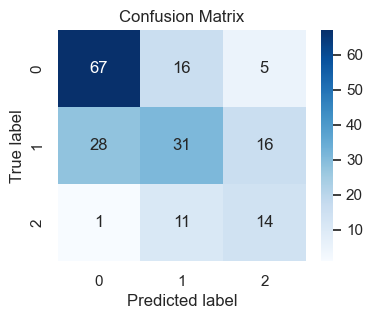

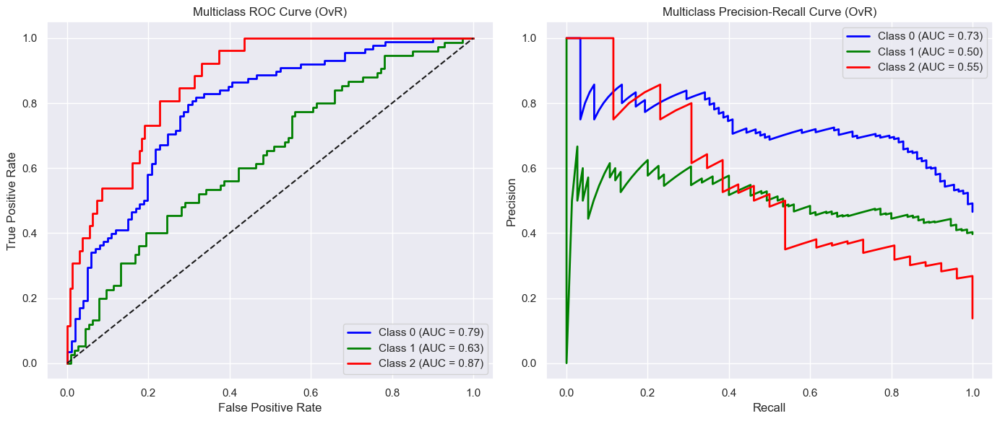

Number of elements in each class:
all-star_class
0    651
1    102
Name: count, dtype: int64

Number of elements in each class after sampling:
all-star_class
0    651
1    651
Name: count, dtype: int64

Binary classification results: all-star vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.94      0.79      0.86       163
           1       0.35      0.69      0.46        26

    accuracy                           0.78       189
   macro avg       0.64      0.74      0.66       189
weighted avg       0.86      0.78      0.81       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.803680981595092
PR AUC: 0.5054900513336663


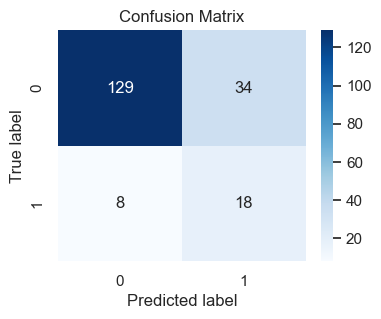

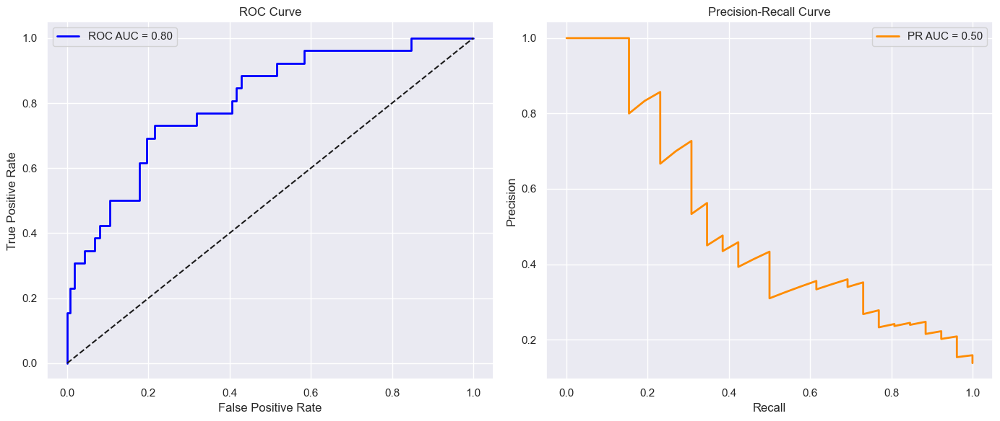

Number of elements in each class:
starter_class
0    453
1    300
Name: count, dtype: int64

Number of elements in each class after sampling:
starter_class
1    453
0    453
Name: count, dtype: int64

Binary classification results: starter vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.68      0.64      0.66       114
           1       0.50      0.55      0.52        75

    accuracy                           0.60       189
   macro avg       0.59      0.59      0.59       189
weighted avg       0.61      0.60      0.61       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.6748538011695907
PR AUC: 0.5373716573865859


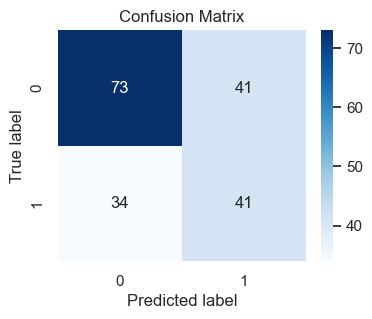

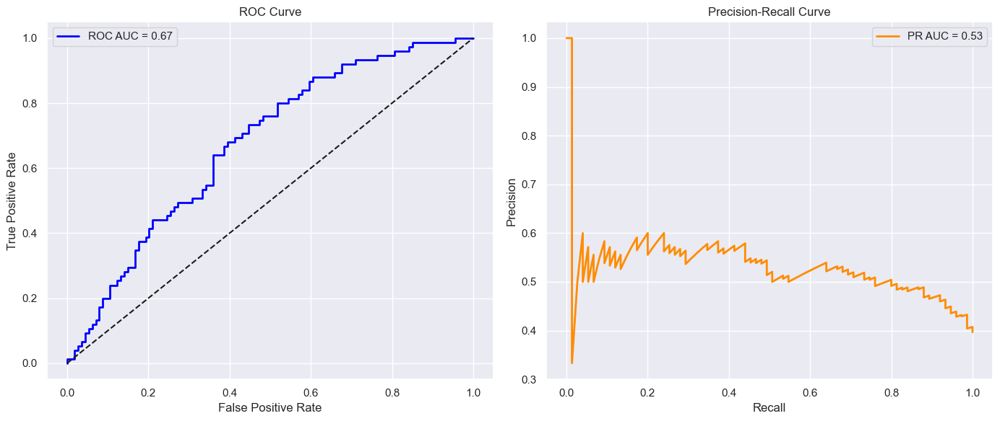

Number of elements in each class:
bench_class
0    402
1    351
Name: count, dtype: int64

Number of elements in each class after sampling:
bench_class
1    402
0    402
Name: count, dtype: int64

Binary classification results: bench vs. others


=== Classification Report ===
               precision    recall  f1-score   support

           0       0.79      0.65      0.71       101
           1       0.67      0.80      0.73        88

    accuracy                           0.72       189
   macro avg       0.73      0.72      0.72       189
weighted avg       0.73      0.72      0.72       189


=== ROC AUC and PR AUC values ===
ROC AUC: 0.7789153915391539
PR AUC: 0.7145809407382684


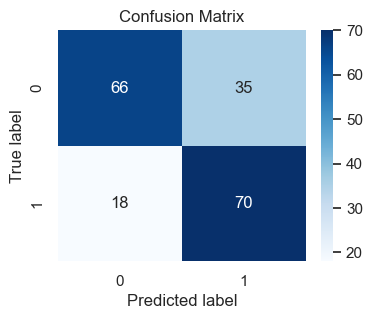

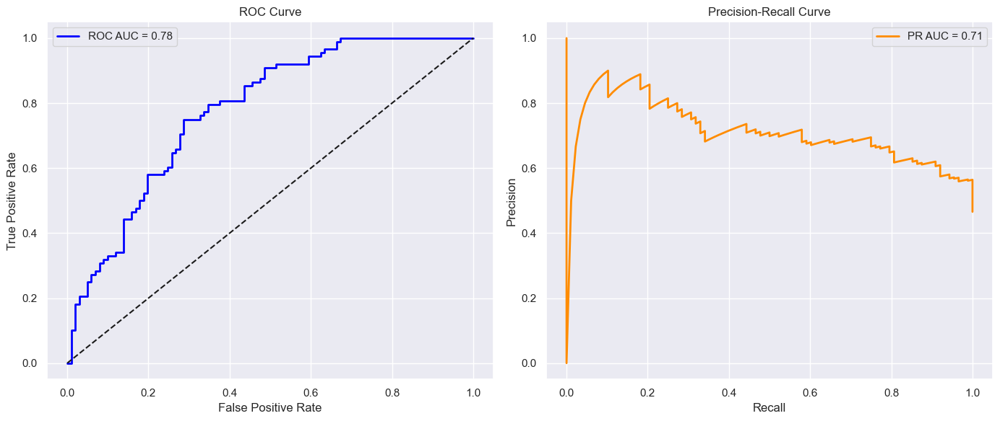

In [119]:
smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X_train, y_train)

print('Number of elements in each class:')
print(y_train.value_counts())
print('\nNumber of elements in each class after sampling:')
print(pd.Series(y_res).value_counts())

rf_smote = RandomForestClassifier(random_state=42, n_estimators=200, min_samples_leaf=3, max_leaf_nodes=10)

rf_smote.fit(X_res, y_res)

y_pred = rf_smote.predict(X_test)
y_pred_proba = rf_smote.predict_proba(X_test)

calculate_evaluation_metrics(rf_smote, y_test, y_pred, y_pred_proba)

for class_num, class_label in zip([2, 1, 0], ["all-star", "starter", "bench"]):
    df_bin = final_dataset_1_seasons.copy()
    df_bin[f'{class_label}_class'] = df_bin['Player_class_num'].apply(lambda x: 1 if x == class_num else 0)

    X_bin = df_bin.drop(columns=['Player_class_num', f'{class_label}_class'])
    y_bin = df_bin[f'{class_label}_class']

    X_train_bin, X_test_bin, y_train_bin, y_test_bin = train_test_split(
        X_bin, y_bin, test_size=0.2, random_state=42, stratify=y_bin)
    
    smote = SMOTE(random_state=42)
    X_res_bin, y_res_bin = smote.fit_resample(X_train_bin, y_train_bin)

    print('Number of elements in each class:')
    print(y_train_bin.value_counts())
    print('\nNumber of elements in each class after sampling:')
    print(pd.Series(y_res_bin).value_counts())
    
    rf_smote_bin = RandomForestClassifier(random_state=42, n_estimators=200, min_samples_leaf=3, max_leaf_nodes=10)

    rf_smote_bin.fit(X_res_bin, y_res_bin)

    y_pred_bin = rf_smote_bin.predict(X_test_bin)
    y_pred_proba_bin = rf_smote_bin.predict_proba(X_test_bin)

    print(f"\nBinary classification results: {class_label} vs. others\n")
    calculate_evaluation_metrics(rf_smote_bin, y_test_bin, y_pred_bin, y_pred_proba_bin)